In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import Colormap as cm
import itertools
from functools import reduce
#import upsetplot

import umap
import leidenalg
import igraph as ig
import networkx as nx

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from scipy.stats import fisher_exact
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
from sklearn.decomposition import PCA


sns.set_style('ticks')
workdir = "/Users/priyaveeraraghavan/Documents/GitHub/inflame/paper_analysis/"


/var/folders/2z/syxkx9497zj7kskxl768d8ym0000gr/T/ipykernel_99054/2673611157.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


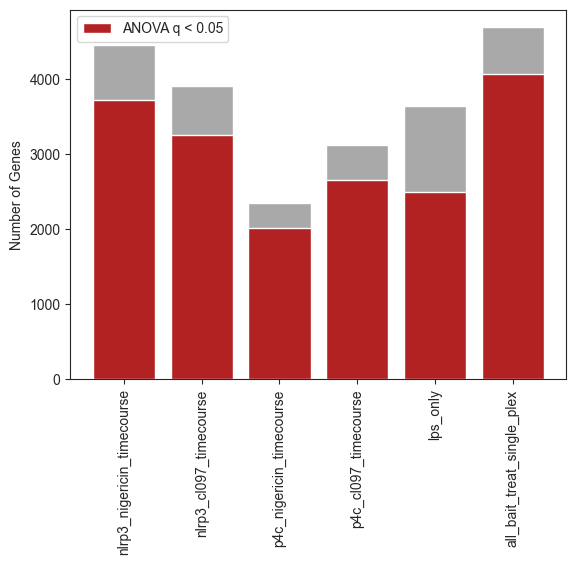

In [25]:
datasets = {'nlrp3_nigericin_timecourse': {'file': workdir+'data/all_stats_results_Nigericin_1peptide_Tukey.csv',
                                           'fc_cols': ['log2FC_t10-t0', 'log2FC_t20-t0', 'log2FC_t30-t0'],
                                           'mean_cols': ['t0', 't10', 't20', 't30']
                                          },
            'nlrp3_cl097_timecourse': {'file': workdir+'data/all_stats_results_NL3CL097_1peptide_medianPolish.csv',
                                      'fc_cols': ['log2FC_t15-t0', 'log2FC_t30-t0', 'log2FC_t60-t0'],
                                      'mean_cols': ['t0', 't15', 't30', 't60']
                                      },
            'p4c_nigericin_timecourse': {'file': workdir+'data/all_stats_results_P4C_Nigericin_1peptide_medianPolish.csv',
                                        'fc_cols': ['log2FC_t10-t0', 'log2FC_t20-t0', 'log2FC_t30-t0'],
                                        'mean_cols': ['t0', 't10', 't20', 't30']
                                        },
            'p4c_cl097_timecourse': {'file': workdir+'data/all_stats_results_P4C_CL097_1peptide_medianPolish.csv',
                                    'fc_cols': ['log2FC_t15-t0', 'log2FC_t30-t0', 'log2FC_t60-t0'],
                                    'mean_cols': ['t0', 't15', 't30', 't60']
                                    },
            'lps_only': {'file': '/Users/priyaveeraraghavan/Documents/GitHub/inflame/Proteomics_Visualization/data/apex/LPS_only/all_stats_results_exp1analysis1.csv',
                        'mean_cols': ['Nlrp3', 'Nlrp3_lps', 'P4c', 'P4c_LPS']
                        },
            'all_bait_treat_single_plex': {'file': '/Users/priyaveeraraghavan/Documents/GitHub/inflame/Proteomics_Visualization/data/apex/single_plex_all_conditions/all_stats_results_APXP4CNLRP3_nobiotin.csv',
                                          }
           }

# for the single-plex
baits = ['P4C', 'NLRP3']
treatments = ['Nigericin', 'CL097', 'LPS']
datasets['all_bait_treat_single_plex']['mean_cols'] = [f"{bait}_{treat}" for bait, treat in itertools.product(baits, treatments)]

for v in datasets.values():
    v['all_data'] = pd.read_csv(v['file'])

# Do Analysis of significantly changing genes per experiment
def get_sig_anova_genes(df):
    return df[df['q.val_anova'] < 0.05].reset_index(drop=True)

sizes = []
for k, v in datasets.items():
    v['sig_anova'] = get_sig_anova_genes(v['all_data'])
    sizes.append(pd.DataFrame({'dataset': [k],
                               'previous_n_genes': [v['all_data'].shape[0]],
                               'anova_filt_n_genes': [v['sig_anova'].shape[0]]
                              })
                )

sizes = pd.concat(sizes)

fig, ax = plt.subplots()
ax.bar(sizes.dataset, sizes.previous_n_genes, color='darkgray')
ax.bar(sizes.dataset, sizes.anova_filt_n_genes, color='firebrick', label='ANOVA q < 0.05')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('Number of Genes')
plt.legend()
plt.savefig(workdir + 'plots/experiment_number_of_genes_significant_anova.pdf')


In [198]:
###
### Data embeddings
###
def embed_data_linear_model(input_df: pd.DataFrame, fc_cols: list[str], timepoints: list[int]):
    """Calculate slope and intercept for each gene."""
    fc_df = input_df[fc_cols]
    
    coefs = []
    intercepts = []
    regs = []

    for i in range(input_df.shape[0]):
        if i == 1:
            print([timepoints])
            print(fc_df.values[i,:])
        reg = LinearRegression().fit(np.array([timepoints]).T, np.array([fc_df.values[i,:]]).T)
        regs.append(reg)


        coefs.append(reg.coef_[0][0])
        intercepts.append(reg.intercept_[0])

        if i == 1:
            print(coefs)
            print(intercepts)

    #print(np.array(coefs).shape)
    #print(np.array(intercepts).shape)
    
    df = pd.DataFrame({'xcol': coefs,
                       'ycol': intercepts,
                       'xcol_name': 'intercept',
                       'ycol_name': 'slope'
                      })

    return df, lambda x: x, regs

def embed_data_pca(input_df: pd.DataFrame, fc_cols: list[str], scale=False, center=False):
    """Calculate principal components each gene."""
    fc_df = input_df[fc_cols]

    scaler = StandardScaler() #scale=scale, center=center)
    df_scaled = scaler.fit_transform(fc_df)

    # PCA on features
    pca = PCA()
    pca_res = pca.fit_transform(df_scaled)
    embed_df = pd.DataFrame(pca_res, columns=['xcol', 'ycol']+[f'PC{i}' for i in range(3, (pca_res.shape[1]+1))])
    embed_df['xcol_name'] = 'PC1'
    embed_df['ycol_name'] = 'PC2'

    
    #print(f"pca shape : {pca_res.shape}")

    return embed_df, scaler, pca

def embed_data_umap(input_df: pd.DataFrame, fc_cols: list[str], scale=False, center=False):
    """Calculate principal components each gene."""
    fc_df = input_df[fc_cols]

    scaler = StandardScaler() #scale=scale, center=center)
    df_scaled = scaler.fit_transform(fc_df)

    umap_fct = umap.UMAP(random_state=42, n_neighbors=20, metric='euclidean', min_dist=0.1)
    embedding = umap_fct.fit_transform(df_scaled)
    embed_df = pd.DataFrame(embedding, columns=['xcol', 'ycol'])
    embed_df['xcol_name'] = 'UMAP1'
    embed_df['ycol_name'] = 'UMAP2'

    return embed_df, scaler, umap_fct

###
### Clustering
###

def cluster_data(embed_df: pd.DataFrame):

    # remove any string cols
    embed_df = embed_df[embed_df.columns[[np.issubdtype(d, np.floating) for d in embed_df.dtypes]]]

    # scale first
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(embed_df)

    # Leiden clustering
    # make a graph
    knn_graph = kneighbors_graph(df_scaled, n_neighbors=20, mode='connectivity')

    # useful https://igraph.org/python/doc/api/igraph.Graph.html#Adjacency
    g = ig.Graph.Adjacency(knn_graph.toarray()) 

    clust = leidenalg.find_partition(g, leidenalg.RBConfigurationVertexPartition, seed=42)

    # also try kmeans clustering
    kmeans_clust = KMeans(n_clusters=20).fit_predict(df_scaled)

    clust_df = pd.DataFrame({'leiden_cluster': [str(x) for x in clust.membership],
                             'kmeans_cluster': [str(x) for x in kmeans_clust]})

    return clust_df, scaler

def transform_cluster_data(input_df: pd.DataFrame, fc_cols: list[str], lm_timepoints: list[int]=None):

    result_dict = {}

    # no transform
    no_transform_clust, no_transform_scale = cluster_data(input_df[fc_cols])
    no_transform_embed, no_transform_scale, umap_fct = embed_data_umap(input_df, fc_cols)
    result_dict['no_transform'] = {'clusters': {'result': no_transform_clust,
                                                'scaler': no_transform_scale
                                               },
                                   'embedding': {'result': no_transform_embed,
                                                      'scaler': no_transform_scale,
                                                      'function': umap_fct
                                                     },
                                    'embedding_type': 'post'

                                  }

    if lm_timepoints is not None:
        # linear model
        lm_embed_df, lm_scaler, lm_fct = embed_data_linear_model(input_df, fc_cols, lm_timepoints)
        lm_clust, lm_clust_scale = cluster_data(lm_embed_df)
        result_dict['linear_model'] = {'embedding': {'result': lm_embed_df,
                                                     'scaler': lm_scaler,
                                                     'function': lm_fct
                                                    },
                                       'clusters': {'result': lm_clust,
                                                    'scaler': lm_clust_scale
                                                   },
                                        'embedding_type': 'pre'
                                      }

    # pca
    pca_embed_df, pca_scaler, pca_fct = embed_data_pca(input_df, fc_cols, scale=True, center=True)
    pca_clust, pca_clust_scale = cluster_data(pca_embed_df)
    result_dict['pca'] = {'embedding': {'result': pca_embed_df,
                                                 'scaler': pca_scaler,
                                                 'function': pca_fct
                                                },
                                   'clusters': {'result': pca_clust,
                                                'scaler': pca_clust_scale
                                               },
                                    'embedding_type': 'pre'
                                  }

    # umap
    umap_embed_df, umap_scaler, umap_fct = embed_data_umap(input_df, fc_cols, scale=True, center=True)
    umap_clust, umap_clust_scale = cluster_data(umap_embed_df)
    result_dict['umap'] = {'embedding': {'result': umap_embed_df,
                                                 'scaler': umap_scaler,
                                                 'function': umap_fct
                                                },
                                   'clusters': {'result': umap_clust,
                                                'scaler': umap_clust_scale
                                               },
                           'embedding_type': 'pre'
                                  }

    
    # df result
    res_dfs = [pd.concat([val['embedding']['result'], val['clusters']['result'], input_df], 
                         axis=1).assign(embedding_type=val['embedding_type'],
                                        embedding_function=key) for key, val in result_dict.items()]

    res_dfs_long = pd.concat(res_dfs, axis=0).rename(columns={'Gene.Symbol': 'external_gene_name'})

    return res_dfs_long, result_dict
    
    
    

In [199]:
# Run transformation and clustering
for v in datasets.values():
    mean_res_df, mean_res_dict = transform_cluster_data(v['sig_anova'], v['mean_cols'], lm_timepoints=None)
    v['cluster_mean'] = {'df': mean_res_df,
                         'model_info': mean_res_dict
                        }
    
    if 'fc_cols' in v.keys():
        fc_res_df, fc_res_dict = transform_cluster_data(v['sig_anova'], v['fc_cols'], lm_timepoints=None)
        v['cluster_fc'] = {'df': fc_res_df,
                           'model_info': fc_res_dict
                          }
    

/Users/priyaveeraraghavan/.virtualenvs/dyno-d92b7213-py3.10.9/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/priyaveeraraghavan/.virtualenvs/dyno-d92b7213-py3.10.9/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/priyaveeraraghavan/.virtualenvs/dyno-d92b7213-py3.10.9/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/priyaveeraraghavan/.virtualenvs/dyno-d92b7213-py3.10.9/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

In [171]:
# write output to file
nigericin_nlrp3_results_df.to_csv(workdir + "data/20230110_nigericin_nlrp3_APEX_clustering_results.csv")
cl097_nlrp3_results_df.to_csv(workdir + "data/20230110_cl097_nlrp3_APEX_clustering_results.csv")

nigericin_p4c_results_df.to_csv(workdir + "data/20230110_nigericin_p4c_APEX_clustering_results.csv")
cl097_p4c_results_df.to_csv(workdir + "data/20230110_cl097_p4c_APEX_clustering_results.csv")

single_plex_results_df.to_csv(workdir + "data/20240323_NLRP3reconst_APEX_single_plex_clustering_results.csv")



In [7]:
def plot_cluster_embedding(embed_df, cluster_col='leiden_cluster', x_col='umap1', y_col='umap2'):
    """Plot the leiden cluster umap with separable colors"""

    
    total_clusters = len(set(embed_df[cluster_col]))
    if total_clusters > 21:
        sns.scatterplot(embed_df, x=x_col, y=y_col, hue=cluster_col, s=5)
        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

    else:
        cmap = plt.get_cmap('tab20')
        embed_df = embed_df.sort_values(cluster_col)
        lut = dict(zip([x for x in embed_df[cluster_col].unique()], [cmap(i) for i in range(min(20, total_clusters))]))
        if total_clusters == 21:
            lut['20'] = 'black'
        print(lut)

        sns.scatterplot(embed_df, x=x_col, y=y_col, hue=cluster_col, palette=lut, s=5)
        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')



In [32]:
all_info = []
for k, v in datasets.items():
    for cluster_type in ['cluster_mean', 'cluster_fc']:
        if cluster_type in v.keys():
            info = v[cluster_type]['df'].query('external_gene_name == "Pycard" & embedding_function == "no_transform"')[['xcol', 'ycol', 'leiden_cluster']]
            info['cluster_type'] = cluster_type
            info['experiment'] = k
            all_info.append(info)

pd.concat(all_info)


,xcol,ycol,leiden_cluster,cluster_type,experiment
2693,3.826196,8.431718,12,cluster_mean,nlrp3_nigericin_timecourse
2693,-0.838869,8.268096,11,cluster_fc,nlrp3_nigericin_timecourse
2363,6.004029,10.161107,3,cluster_mean,nlrp3_cl097_timecourse
2363,-4.167538,11.738042,9,cluster_fc,nlrp3_cl097_timecourse
1706,12.021961,7.828471,0,cluster_mean,p4c_nigericin_timecourse
1706,13.620986,3.559041,1,cluster_fc,p4c_nigericin_timecourse
2250,5.753148,-1.412440,0,cluster_mean,p4c_cl097_timecourse
2250,-3.929338,4.080468,5,cluster_fc,p4c_cl097_timecourse
2122,10.501372,10.127047,2,cluster_mean,lps_only
3437,4.265993,7.306382,12,cluster_mean,all_bait_treat_single_plex


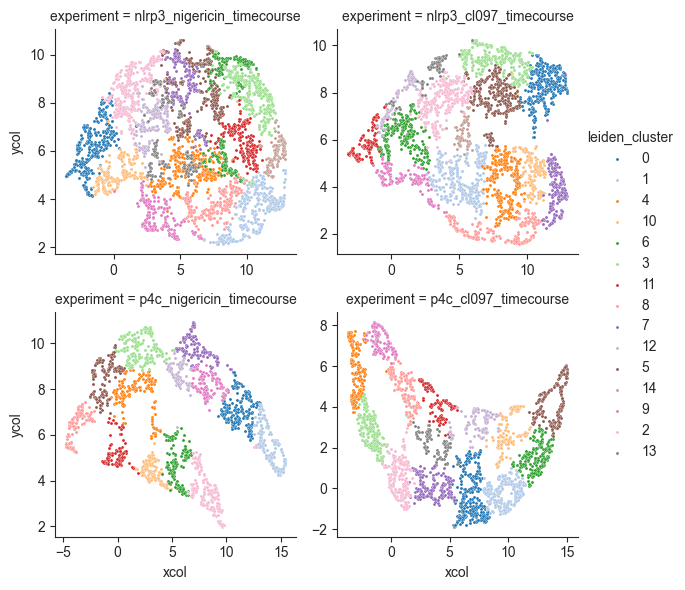

In [35]:
# mean intensities probably don't capture the proper information
df_toplot = pd.concat([datasets[k]['cluster_mean']['df'].query(
    'embedding_function == "no_transform"').assign(experiment=k) for k in datasets.keys() if 'cluster_fc' in datasets[k].keys()])

g = sns.FacetGrid(df_toplot, hue='leiden_cluster', col='experiment', palette='tab20', col_wrap=2, sharex=False, sharey=False)
g.map(sns.scatterplot, 'xcol', 'ycol', s=5)
g.add_legend()

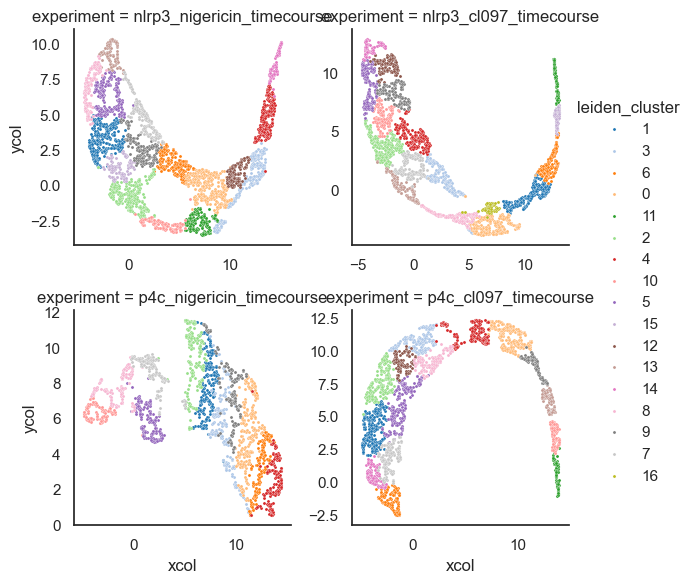

In [187]:
# fc are more informative because all genes go onto same scale
df_toplot = pd.concat([datasets[k]['cluster_fc']['df'].query(
    'embedding_function == "no_transform"').assign(experiment=k) for k in datasets.keys() if 'cluster_fc' in datasets[k].keys()])

g = sns.FacetGrid(df_toplot, hue='leiden_cluster', col='experiment', palette='tab20', col_wrap=2, sharex=False, sharey=False)
g.map(sns.scatterplot, 'xcol', 'ycol', s=5)
g.add_legend()



valid genes length 1242
                    node1                         node2    weight
0  p4c_cl097_timecourse_0  nlrp3_nigericin_timecourse_0  0.010101
1  p4c_cl097_timecourse_0  nlrp3_nigericin_timecourse_1  0.000000
2  p4c_cl097_timecourse_0  nlrp3_nigericin_timecourse_2  0.123967
3  p4c_cl097_timecourse_0  nlrp3_nigericin_timecourse_3  0.004274
4  p4c_cl097_timecourse_0  nlrp3_nigericin_timecourse_4  0.088710
6


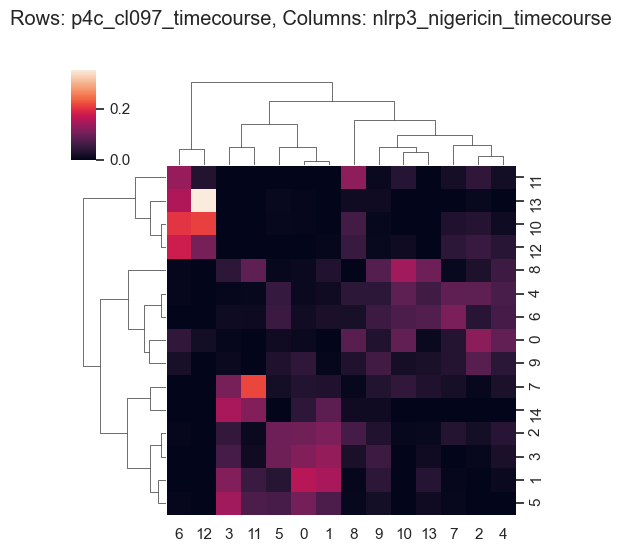

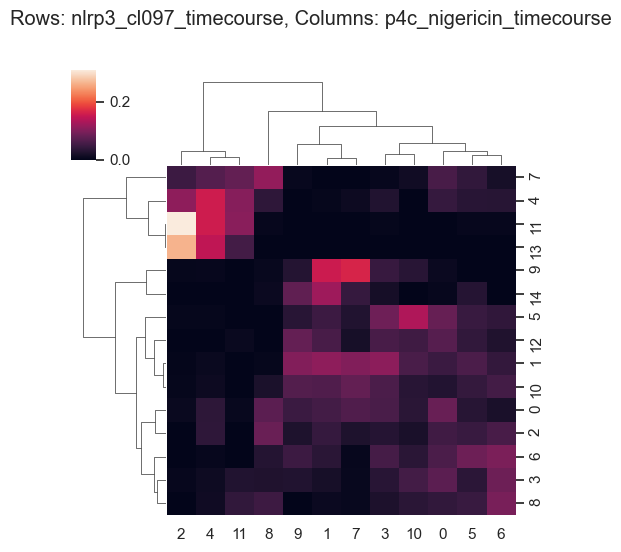

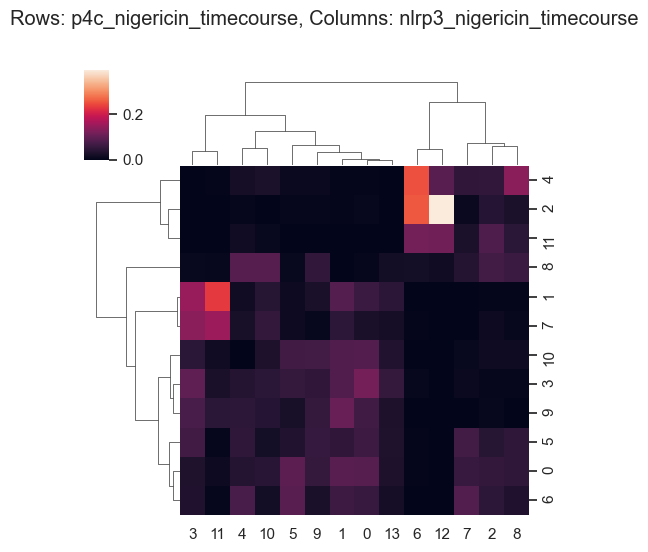

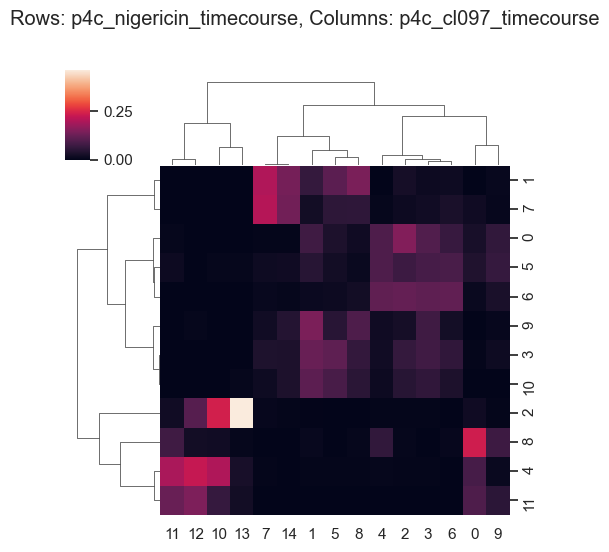

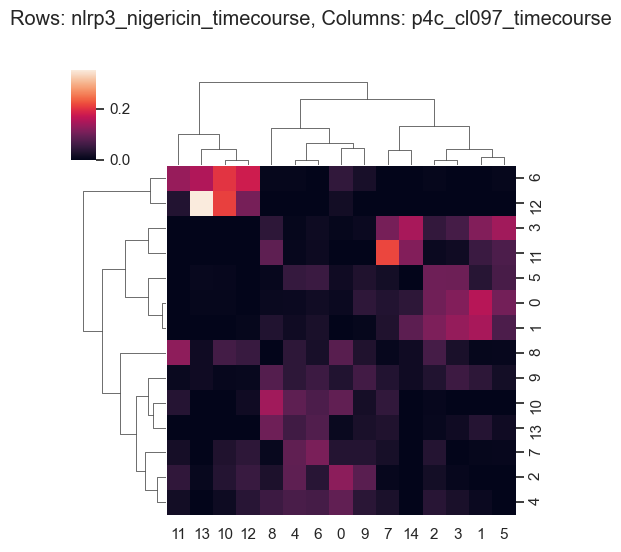

...

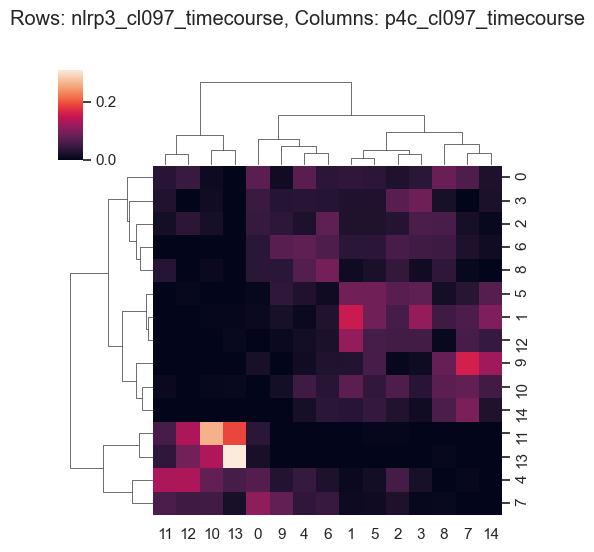

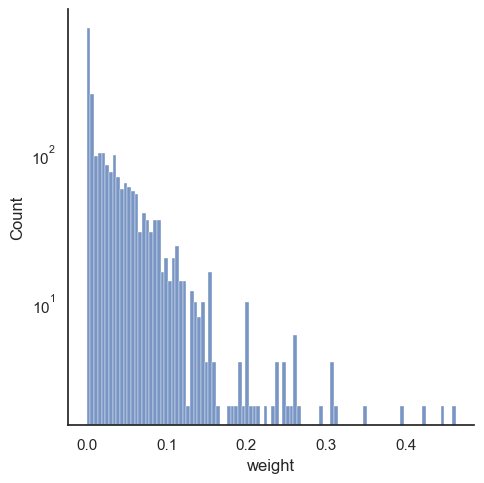

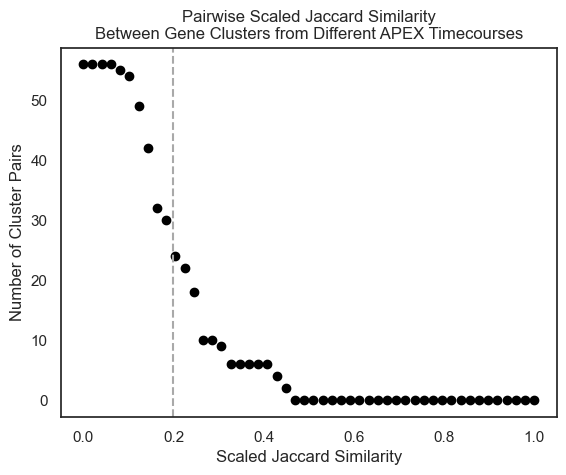

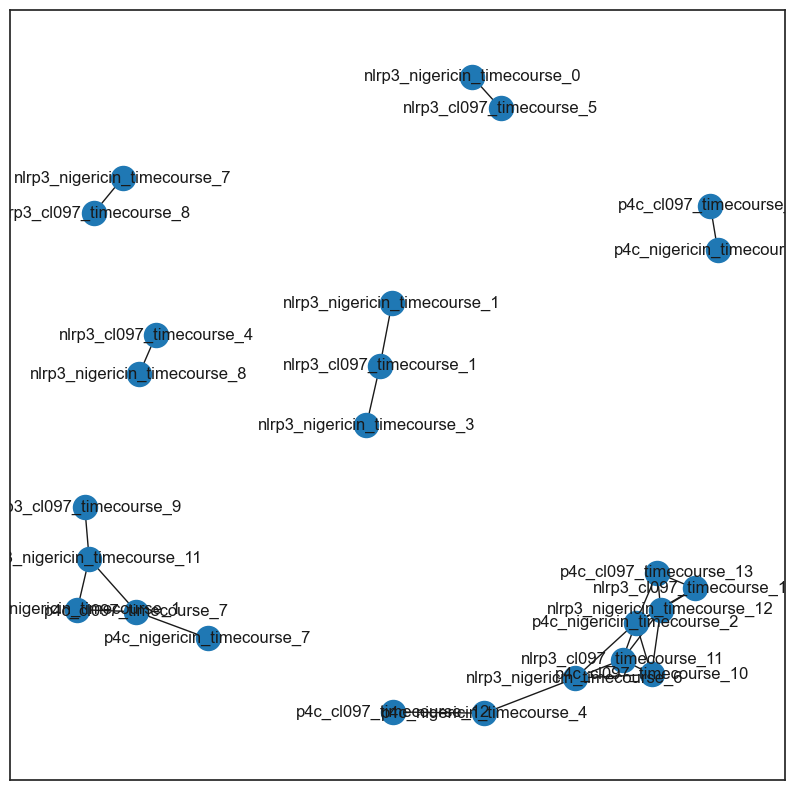

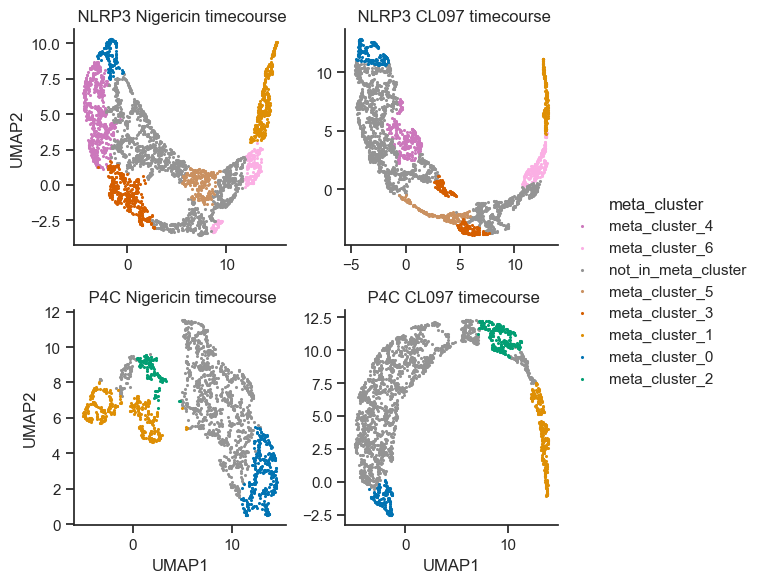

In [200]:
## Cluster overlap
def get_cluster_jaccard_index(df1, df2, cluster_label1, cluster_label2, cluster_col, valid_genes=None):

    genes_df1 = set(df1.query(f'{cluster_col} == "{cluster_label1}"').external_gene_name.values)
    genes_df2 = set(df2.query(f'{cluster_col} == "{cluster_label2}"').external_gene_name.values)

    if valid_genes is not None:
        genes_df1 = genes_df1.intersection(set(valid_genes))
        genes_df2 = genes_df2.intersection(set(valid_genes))
        
    intersection = genes_df1.intersection(genes_df2)
    union = genes_df1.union(genes_df2)

    return len(intersection), len(union)

def get_all_cluster_similarity(df1, df2, cluster_col, valid_genes=None):

    nclust1 = len(df1[cluster_col].unique())
    nclust2 = len(df2[cluster_col].unique())
    #print(f"df1 has {nclust1} clusters")
    #print(f"df2 has {nclust2} clusters")


    intersection_mat = np.zeros((nclust1, nclust2))
    union_mat = np.zeros((nclust1, nclust2))

    for i in range(nclust1):
        for j in range(nclust2):
            intersect, union = get_cluster_jaccard_index(df1, df2, i, j, cluster_col, valid_genes=valid_genes)
            intersection_mat[i,j] = intersect
            union_mat[i,j] = union
            

    return pd.DataFrame(intersection_mat/union_mat, 
                        index=[str(x) for x in range(nclust1)],
                        columns=[str(x) for x in range(nclust2)]) #, intersection_mat



# can only compare genes that are present in all datasets
valid_genes = reduce(lambda x, y: set(x).intersection(set(y)), 
                     [df.external_gene_name.values for df in 
                      [v['cluster_fc']['df'] for v in datasets.values() if 'cluster_fc' in v.keys()]])


print("valid genes length", len(valid_genes))
key_combos = list(set(itertools.permutations([k for k in datasets.keys() if 'cluster_fc' in datasets[k]], 2)))
                    
cluster_sim_overlap = [get_all_cluster_similarity(datasets[k1]['cluster_fc']['df'].query('embedding_function == "no_transform"'), 
                                                  datasets[k2]['cluster_fc']['df'].query('embedding_function == "no_transform"'),
                                                  'leiden_cluster', valid_genes=valid_genes) for k1, k2 in key_combos]

## Plot a heatmap of each pairwise similarity
for i in range(len(key_combos)):
    
    g = sns.clustermap(cluster_sim_overlap[i], figsize=(5, 5), metric='cosine') #, cmap='plasma')
    g.fig.suptitle(f"Rows: {key_combos[i][0]}, Columns: {key_combos[i][1]}", y=1.1)
                       


# Make an adjacency list for each cluster with edges as normalized similarity
def get_adjacency_list(norm_jaccard, row_prefix, col_prefix):
    adjacency_lst = []
    for i in range(norm_jaccard.shape[0]):
        for j in range(norm_jaccard.shape[1]):
            value = norm_jaccard.values[i, j]
            adjacency_lst.append([[f"{row_prefix}_{i}", f"{col_prefix}_{j}", value]])

    res = pd.DataFrame(np.concatenate(adjacency_lst),
                      columns=["node1", "node2", "weight"])
    return res
            

adjacency_lst = pd.concat([get_adjacency_list(df, k[0], k[1]) for df, k in zip(cluster_sim_overlap, key_combos)])
adjacency_lst.weight = adjacency_lst.weight.astype('float')
print(adjacency_lst.head())
sns.displot(adjacency_lst, x='weight', bins=100, log_scale=[False, True]) #, log_scale=[True, True])


# print num clusters retained after each cutoff
weight_cutoffs = np.linspace(0, 1)
num_clusters = [len(adjacency_lst[adjacency_lst.weight > w].node1.unique()) for w in weight_cutoffs]
fig, ax = plt.subplots()
ax.scatter(weight_cutoffs, num_clusters, color='black')
ax.set_xlabel('Scaled Jaccard Similarity')
ax.set_ylabel('Number of Cluster Pairs')
ax.axvline(0.2, color='darkgray', ls='--')
plt.title('Pairwise Scaled Jaccard Similarity\nBetween Gene Clusters from Different APEX Timecourses')
plt.savefig(workdir+'plots/APEX_timecourse_compare_plex_jaccard_similarity_scores_anova_filt.pdf')


# draw a cutoff of around 0.2 for similarity
# graph
G = nx.from_pandas_edgelist(adjacency_lst[adjacency_lst.weight > 0.2], source='node1', target='node2', edge_attr='weight')

fig, ax = plt.subplots(figsize=(10, 10))
nx.draw_networkx(G, ax=ax)


connected_components = [x for x in nx.connected_components(G)]
connected_components_df = pd.concat([pd.DataFrame({'node': list(connected_components[i]), 
                                                   'connected_component': i, 
                                                   'meta_cluster': 'meta_cluster_'+str(i)}
                                                 ) for i in range(len(connected_components))])
print(connected_components_df.connected_component.max())
# get all clustering location results
all_treat_connected_components = pd.concat([datasets[k]['cluster_fc']['df'].query(
    'embedding_function == "no_transform"').assign(experiment=k) for k in datasets.keys() if 'cluster_fc' in datasets[k].keys()])

# extract the name of the corersponding node in the graph 
# {experiment}_{cluster}
all_treat_connected_components['node'] = all_treat_connected_components['experiment'] + '_' + all_treat_connected_components['leiden_cluster'].astype('str')

# merge the connected component graph with the clustering and UMAP embeddings
all_treat_connected_components = all_treat_connected_components.merge(connected_components_df, on='node', how='outer')

# assign all clusters not sufficiently similar as 'not_similar'
all_treat_connected_components = all_treat_connected_components.fillna(value={'meta_cluster' : 'not_in_meta_cluster'})


#colors = ['royalblue', 'firebrick', 'lightblue', 'mediumpurple', 'seagreen', 'lightgray']

colors = sns.color_palette("colorblind", 11)
clust_order = ['meta_cluster_'+str(i) for i in range(7)] + ['not_in_meta_cluster', 'meta_cluster_7', 'meta_cluster_8', 'meta_cluster_9']
color_dict = dict(zip(clust_order, colors))
sns.set_style('ticks')
g = sns.FacetGrid(all_treat_connected_components, hue='meta_cluster', col='experiment', palette=color_dict, col_wrap=2, sharex=False, sharey=False) #, palette=color_dict)
g.map(sns.scatterplot, 'xcol', 'ycol', s=5, linewidth=0, rasterized=True)
g.add_legend()
for ax in g.axes.flatten():
    title = ax.get_title().split("=")[1].replace("_", " "
                                                ).replace('nigericin', 'Nigericin'
                                                ).replace('nlrp3', 'NLRP3'
                                                ).replace('cl097', 'CL097'
                                                ).replace('p4c', 'P4C')
    ax.set_title(title)
    if ax.get_xlabel() != "":
        ax.set_xlabel('UMAP1')
    if ax.get_ylabel() != "":
        ax.set_ylabel("UMAP2")
        
plt.savefig(workdir + f"plots/APEX_timecourse_compare_plex_UMAP_anova_filt.pdf", dpi=300)

In [182]:
# Alternatively, use the Adjusted Rand Score
from sklearn.metrics import adjusted_rand_score


# make wide fmt
all_cluster_wide = all_treat_connected_components.pivot(index='Reference', columns='experiment', values='leiden_cluster').dropna()

# grab the different clustering conditions
all_conditions = all_cluster_wide.columns
all_cluster_wide.reset_index(inplace=True)

# get the adjusted rand indexes
ari_timecourse = pd.concat([
    pd.DataFrame({'group1': [x], 
                  'group2': [y], 
                  'ARI': [adjusted_rand_score(all_cluster_wide[x], all_cluster_wide[y])]
                 }) for x, y in itertools.combinations(all_conditions, 2)])
ari_timecourse

,group1,group2,ARI
0,nlrp3_cl097_timecourse,nlrp3_nigericin_timecourse,0.205561
0,nlrp3_cl097_timecourse,p4c_cl097_timecourse,0.085397
0,nlrp3_cl097_timecourse,p4c_nigericin_timecourse,0.095610
0,nlrp3_nigericin_timecourse,p4c_cl097_timecourse,0.127416
0,nlrp3_nigericin_timecourse,p4c_nigericin_timecourse,0.132244
0,p4c_cl097_timecourse,p4c_nigericin_timecourse,0.157839


/Users/priyaveeraraghavan/.virtualenvs/dyno-d92b7213-py3.10.9/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


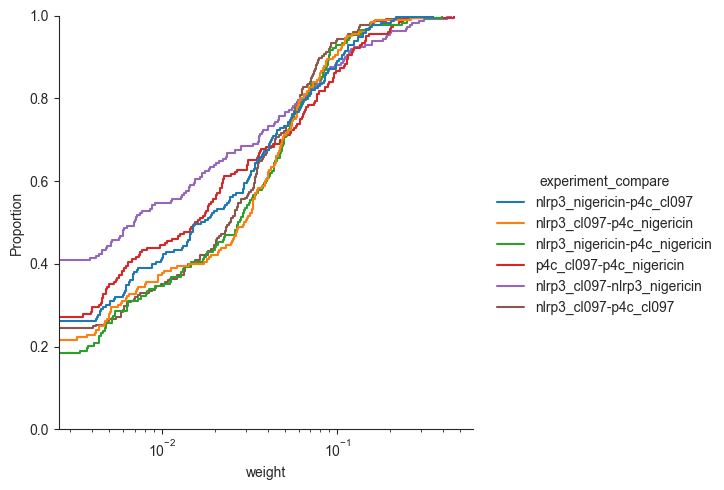

In [61]:
adjacency_lst['experiment_compare'] = ["-".join(sorted(["_".join(x.split('_')[:2]), "_".join(y.split('_')[:2])])) for x, y in zip(adjacency_lst.node1,  adjacency_lst.node2)]
adjacency_lst['weight_ps'] = adjacency_lst['weight']+0.001
sns.displot(adjacency_lst, x='weight', hue='experiment_compare', kind='ecdf', log_scale=True)

/Users/priyaveeraraghavan/.virtualenvs/dyno-d92b7213-py3.10.9/lib/python3.10/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


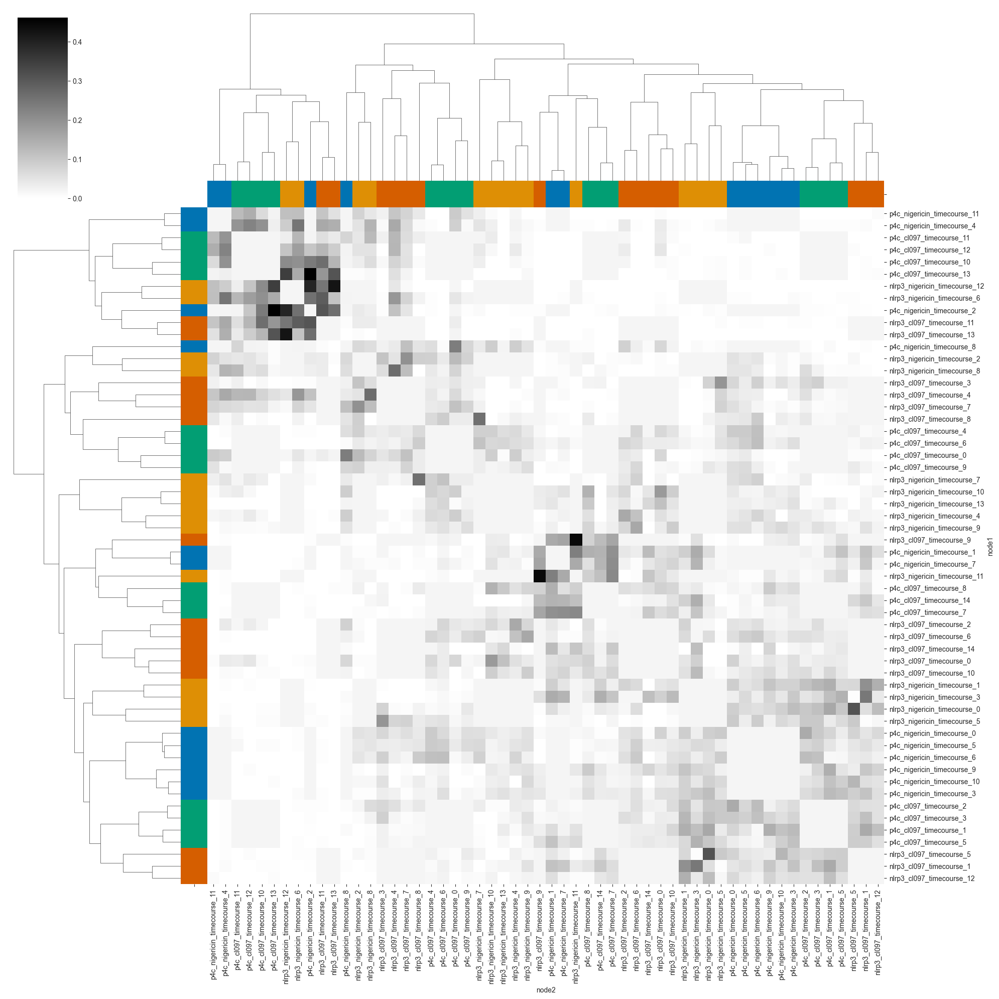

In [66]:
adj_mat = adjacency_lst.pivot(index='node1', columns='node2', values='weight').fillna(0)
mask = np.zeros_like(adj_mat)

def get_cluster_key(cluster_name):
    key = '_'.join(cluster_name.split('_')[:2])
    return key
    
for n1 in range(adj_mat.shape[0]):
   for n2 in range(adj_mat.shape[1]):
        if get_cluster_key(adj_mat.index[n1]) == get_cluster_key(adj_mat.columns[n2]):
            mask[n1, n2] = True

cm = mpl.colormaps['binary']
cm.set_bad("whitesmoke") 

            
color_map = dict(zip(['p4c_nigericin', 'nlrp3_nigericin', 'p4c_cl097', 'nlrp3_cl097', ], sns.color_palette('colorblind', 4)))


                     
row_colors = pd.Series([color_map[get_cluster_key(x)] for x in adj_mat.index], index=adj_mat.index)
col_colors = pd.Series([color_map[get_cluster_key(x)] for x in adj_mat.columns], index=adj_mat.columns)

sns.clustermap(adj_mat,  metric='cosine', col_colors=col_colors, row_colors=row_colors, cmap=cm, mask=mask, figsize=(20, 20))
plt.savefig(workdir + "plots/APEX_timecourse_compare_plex_gene_clusters_heatmap_of_normalized_jaccard_scores_anova_filt.pdf")

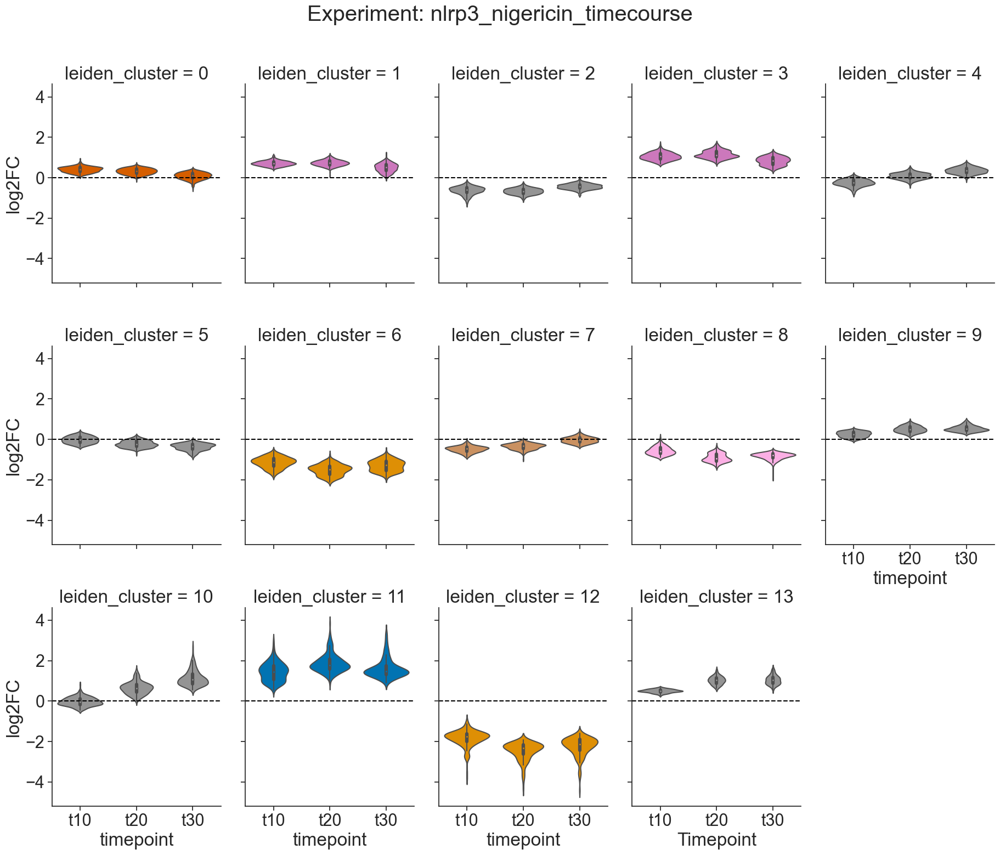

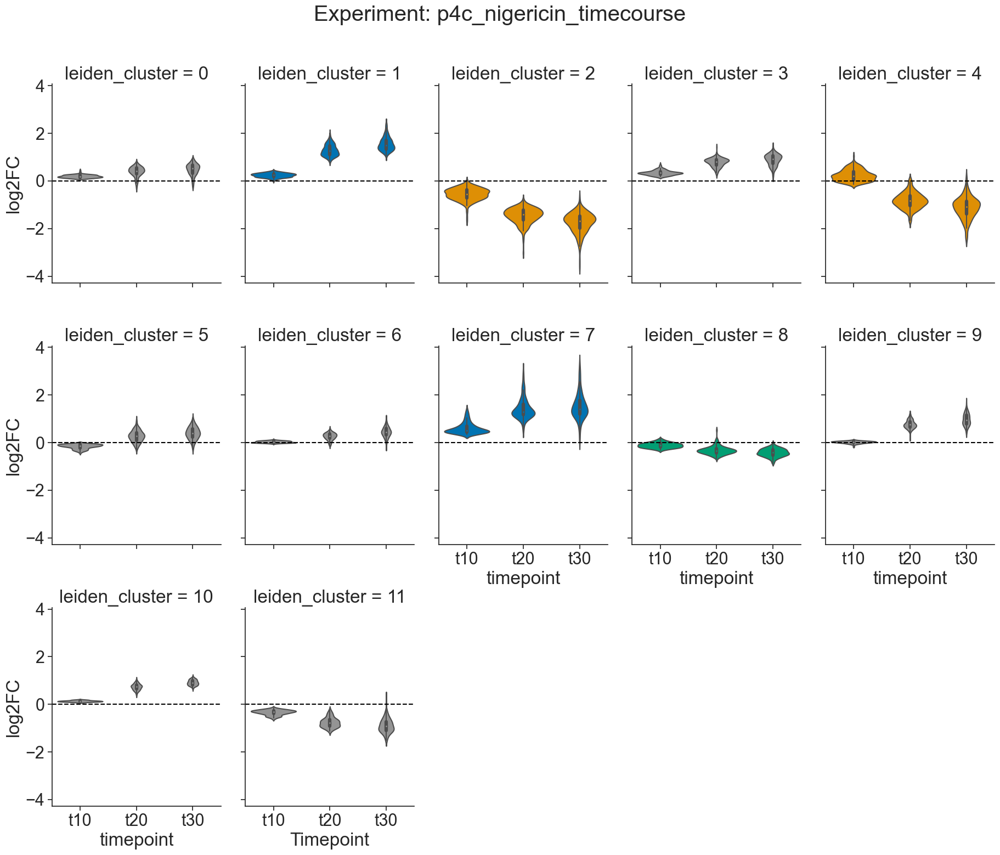

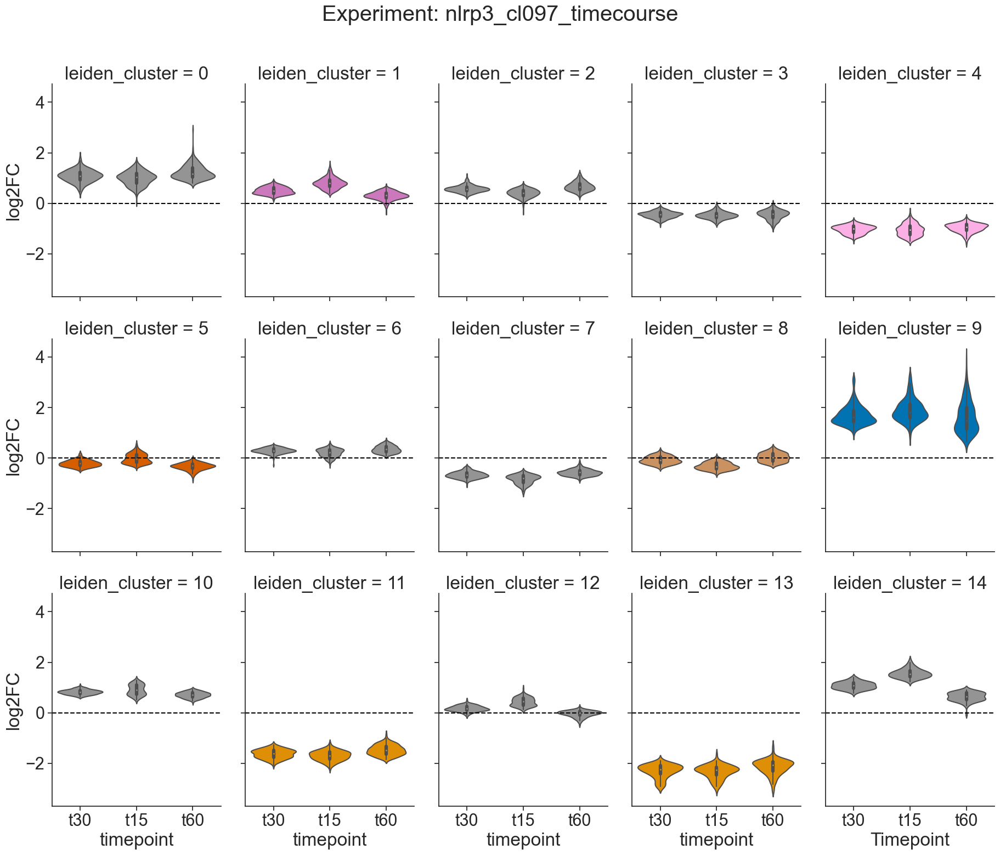

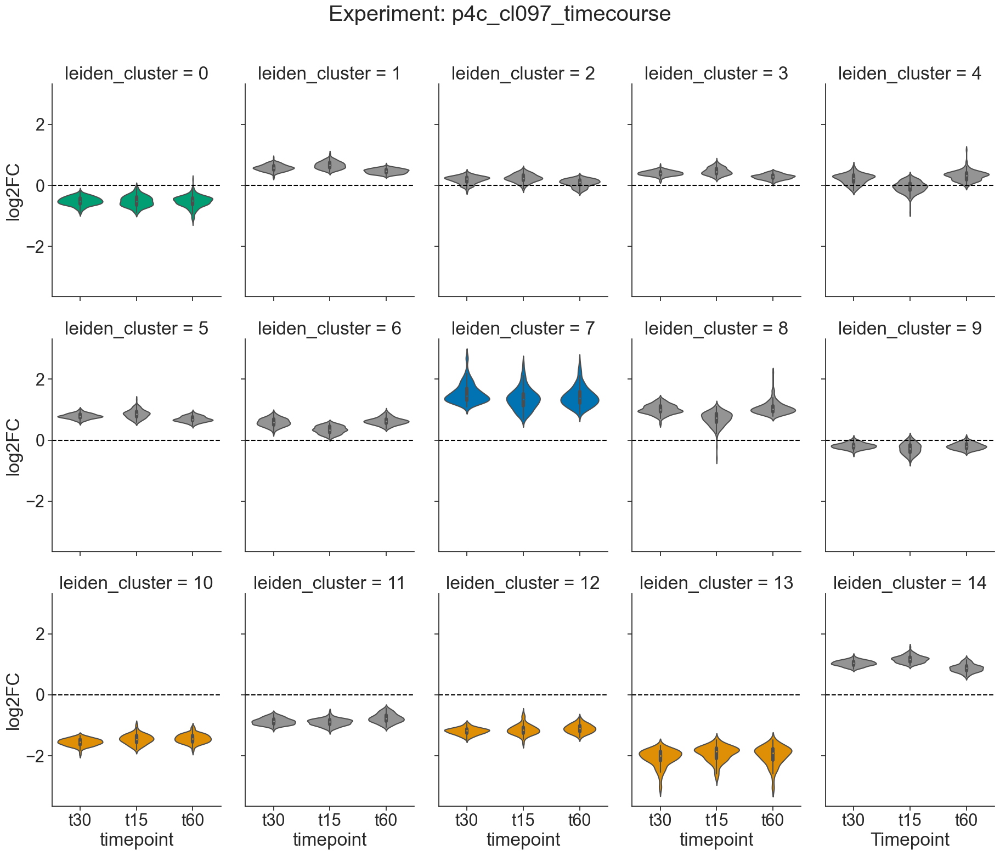

In [117]:
def plot_cluster_trends(df_subs, color_dict=color_dict):
    """
    Plot cluster trends using violin plots.

    Parameters:
    - df_subs: DataFrame containing subset data
    - color_dict: dict mapping meta_cluster name to color
    
    Returns:
    - FacetGrid object representing the plotted cluster trends
    """

    # Determine the order of columns based on leiden_cluster values
    col_order = [str(i) for i in range(df_subs.leiden_cluster.astype(int).max() + 1)]

    # Create violin plots using sns.catplot
    g = sns.catplot(data=df_subs, x='timepoint', y='log2FC', col='leiden_cluster',
                    col_wrap=5, kind='violin', color='gray', aspect=0.75,
                    col_order=col_order)

    # Customize face colors of violins based on meta clusters
    for ax in g.axes.flatten():
        # Extract the cluster number from the subplot title
        cluster = ax.get_title().split("=")[1].strip(" ")

        # Get the corresponding meta cluster for the current cluster
        meta_cluster = df_subs.query(f'leiden_cluster == "{cluster}"').meta_cluster.values[0]

        # Set face color of each violin based on its meta cluster
        for violin in ax.collections:
            violin.set_facecolor(color_dict[meta_cluster])

        # Add a horizontal dashed line at y=0 for reference
        ax.axhline(y=0, ls='--', color='black')

    # Set plot labels and title
    plt.xlabel('Timepoint')
    plt.ylabel('Log2 Fold Change')
    plt.suptitle('Cluster Trends')


    return g
    
    
logfc_cols = [x for x in all_treat_connected_components if 'log2FC' in x and '-t0' in x]
id_vars = ['Reference', 'external_gene_name', 'experiment', 'leiden_cluster', 'meta_cluster']
long_df = all_treat_connected_components[logfc_cols+id_vars].melt(id_vars=id_vars, value_name='log2FC').dropna()
long_df['timepoint'] = long_df.variable.apply(lambda x: x.replace('log2FC_', '').replace('-t0', ''))

for experiment in long_df.experiment.unique():
    df_subs = long_df.query(f'experiment == "{experiment}"').copy().reset_index()
    g = plot_cluster_trends(df_subs)
    g.fig.suptitle("Experiment: "+experiment, y=1.05)
    plt.savefig(workdir + f'plots/{experiment}_timecourse_logFC_cluster_violins.pdf')


In [ ]:
## Now calculate enrichment of organelle proteins in each cluster

In [222]:
## Get the enrichment in each cluster for genes associated with a particular organelle
## using the czi annotations


def calc_group_intersections(gene_cluster_df: pd.DataFrame, cluster_query, analysis_query, annotation_df: pd.DataFrame, annotation_column: str, gene_universe: np.array, gene_column: str = 'external_gene_name'):
    # for each unique value in annotation_column, calculate the enrichment of gene_subset using fisher's exact test

    all_genes_measured = set(gene_universe)
    all_genes_annotated = set(annotation_df[gene_column])
    
    valid_genes = all_genes_measured.intersection(all_genes_annotated)
    total_genes = len(valid_genes)

    # genes in cluster
    gene_subset = set(gene_cluster_df.query(f"{cluster_query} & {analysis_query}")[gene_column]).intersection(valid_genes)

    annot_df = annotation_df[annotation_df[gene_column].isin(valid_genes)]
    gene_overlaps = annot_df.groupby(annotation_column,
                                         ).agg({'external_gene_name': 
                                                (('gene_group_organelle', lambda x: len(set(x).intersection(gene_subset))),
                                                 ('gene_group_not_organelle', lambda x: len(gene_subset.difference(set(x)))),
                                                 ('organelle_not_gene_group', lambda x: len(set(x).difference(gene_subset))),
                                                 ('organelle_or_gene_group', lambda x: len(set(x).union(gene_subset))),
                                                 ('shared_genes', lambda x: ";".join(set(x).intersection(set(gene_subset)))),
                                                ('num_organelle', lambda x: len(set(x))))})

    gene_overlaps.columns = gene_overlaps.columns.get_level_values(1)
    gene_overlaps.reset_index(inplace=True)
    
    gene_overlaps['total_genes'] = total_genes
    gene_overlaps['gene_group'] = len(gene_subset)

    # significance
    #print("gene group and organelle", gene_overlaps.gene_group_organelle.min())
    #print("gene group not organelle", gene_overlaps.gene_group_not_organelle.min())
    #print("organelle not gene group", gene_overlaps.organelle_not_gene_group.min())
    #print("total genes", total_genes)
    #print("organelle or gene group", gene_overlaps.organelle_or_gene_group.max())
    gene_overlaps['fisher_res'] = gene_overlaps.apply(lambda row: fisher_exact([[row['gene_group_organelle'], row['gene_group_not_organelle']],
                                                                          [row['organelle_not_gene_group'], total_genes-row['organelle_or_gene_group']]],
                                                                              alternative='greater'),
                                                      axis=1)
    gene_overlaps['fisher_pval'] = gene_overlaps.fisher_res.apply(lambda x: x.pvalue)
    gene_overlaps['odds_ratio'] = gene_overlaps.fisher_res.apply(lambda x: x.statistic)

    return gene_overlaps

def get_organelle_enrichment_clusters(gene_cluster_df: pd.DataFrame, analysis_query, cluster_col, gene_universe): 
    """Helper to iterate through clusters"""

    # not used: ip_annotations = pd.read_csv(workdir+'data/czi_organelle_annot_IP_enriched.csv')
    graph_annotations = pd.read_csv(workdir+'data/czi_organelle_annot_graph_based.csv')

    # filter based on presence in data
    # not used: ip_annotations_filt = ip_annotations[ip_annotations.external_gene_name.isin(embedding_df['Gene.Symbol'])]
    graph_annotations_filt = graph_annotations.rename(
        columns={'graph_localization_annotation': 'organelle_annotation'})


    # not used: print("Total from IP: {}, Shared: {}".format(ip_annotations.shape[0], ip_annotations_filt.shape[0]))
    # print("Total from Graph-Based: {}".format(graph_annotations_filt.shape[0]))
    
    analysis_df = gene_cluster_df.query(analysis_query)
    
    clusters = analysis_df[cluster_col].unique()


    return pd.concat([calc_group_intersections(gene_cluster_df, f'{cluster_col} == "{i}"',
                      analysis_query, graph_annotations_filt, 'organelle_annotation', gene_universe,
                                               gene_column='external_gene_name',
                                              ).assign(cluster=i) for i in clusters]) 

### Graph intersections

## Individual datasets
for k, v in datasets.items():
    all_genes = v['all_data']['Gene.Symbol'].values
    for cluster_type in ['cluster_fc', 'cluster_mean']:
        if cluster_type in v.keys():
            enrich_res = get_organelle_enrichment_clusters(
                v[cluster_type]['df'], f'embedding_function == "no_transform"', 'leiden_cluster', 
                all_genes)
            
            v[cluster_type]['organelle_enrichment'] = enrich_res

            # write enrichment info to file
            enrich_res.to_csv(workdir+f'tables/APEX_{k}_clusters_organelle_enrichment.csv')


## Meta-clusters
# the background frequency is determined by the genes that are measured in all experiments
meta_cluster_gene_universe = reduce(lambda x, y: set(x).intersection(set(y)), 
                                    [datasets[k]['all_data']['Gene.Symbol'].values for k in [
                                        'nlrp3_nigericin_timecourse', 'nlrp3_cl097_timecourse', 
                                        'p4c_nigericin_timecourse', 'p4c_cl097_timecourse']]
                                   )
meta_cluster_unique_df = all_treat_connected_components[['Reference', 'external_gene_name', 'meta_cluster']].assign(keep=True).drop_duplicates()
meta_cluster_organelle_enrichment = get_organelle_enrichment_clusters(meta_cluster_unique_df, 'keep == True', 'meta_cluster', meta_cluster_gene_universe) 
# add leiden cluster info --> sometimes multiple clusters from one experiment in a meta cluster
meta_cluster_df = all_treat_connected_components.groupby(
    ['experiment', 'meta_cluster']
).agg({'leiden_cluster': lambda x: ";".join(x.astype(str).unique())}) 
meta_cluster_df.columns = [x+'_leiden_clusters' for x in meta_cluster_df.columns]
meta_cluster_df = meta_cluster_df.reset_index()

# write the gene and meta_cluster information to file
meta_cluster_df.to_csv(workdir+'tables/timecourse_meta_cluster_leiden_assignments.csv')

# merge with organelle enrichment and write to file
meta_cluster_df = meta_cluster_organelle_enrichment[['cluster', 'organelle_annotation', 'shared_genes', 'fisher_pval', 'odds_ratio', 'gene_group_organelle']]
meta_cluster_df.rename(columns={'gene_group_organelle': 'gene_intersection_size', 'cluster': 'meta_cluster'}, inplace=True)
meta_cluster_df.to_csv(workdir+'tables/APEX_all_timecourse_meta_clusters_organelle_enrichment.csv')



/var/folders/2z/syxkx9497zj7kskxl768d8ym0000gr/T/ipykernel_99054/2931454642.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_cluster_df.rename(columns={'gene_group_organelle': 'gene_intersection_size', 'cluster': 'meta_cluster'}, inplace=True)


In [219]:
meta_cluster_df

,experiment,meta_cluster,leiden_cluster_leiden_clusters,organelle_annotation,shared_genes,fisher_res,fisher_pval,odds_ratio,cluster,gene_intersection_size
0,nlrp3_cl097_timecourse,meta_cluster_0,9,14-3-3_scaffold,Ppip5k2;Nadk;Ywhae,"(0.7886251679355127, 0.7370542507999414)",7.370543e-01,0.788625,meta_cluster_0,3
1,nlrp3_cl097_timecourse,meta_cluster_0,9,ER,Sptlc2;Rtn4;Aimp2;Vapb;Mtdh;Ttc1;Emd;Cdk5rap3,"(0.1153014368241742, 0.9999999999999999)",1.000000e+00,0.115301,meta_cluster_0,8
2,nlrp3_cl097_timecourse,meta_cluster_0,9,ERGIC,Scfd1;Sec31a;Yif1b,"(0.4043887147335423, 0.9703527100394027)",9.703527e-01,0.404389,meta_cluster_0,3
3,nlrp3_cl097_timecourse,meta_cluster_0,9,Golgi,Zdhhc13;Zdhhc3;Cog3;Golga4;Cux1;Yipf4;Rab1b;Zd...,"(1.6239482200647248, 0.10691034210428324)",1.069103e-01,1.623948,meta_cluster_0,13
4,nlrp3_cl097_timecourse,meta_cluster_0,9,actin_cytoskeleton,Pdcl3;Myl6;Dbnl;Mtpn;Vbp1;Snx18;Arpc3;Wdr1;Was...,"(2.3006895591000904, 0.0007262136964959265)",7.262137e-04,2.300690,meta_cluster_0,29
...,...,...,...,...,...,...,...,...,...,...
457,p4c_nigericin_timecourse,meta_cluster_2,8,recycling_endosome,Pacc1;Ldlr;Ptprj,"(2.293310463121784, 0.18326723613672494)",1.832672e-01,2.293310,meta_cluster_2,3
458,p4c_nigericin_timecourse,meta_cluster_2,8,stress_granule,Hspa14;Rps23;Rps11;Mthfd1;Rps20;Pdcd2,"(0.5787545787545788, 0.9358685316349735)",9.358685e-01,0.578755,meta_cluster_2,6
459,p4c_nigericin_timecourse,meta_cluster_2,8,trans-Golgi,Cpd;Mtmr6,"(0.83, 0.7020483313631306)",7.020483e-01,0.830000,meta_cluster_2,2
460,p4c_nigericin_timecourse,meta_cluster_2,8,translation,Rpl11;Rpl32;Rpl6;Rpl27;Rpl8;Rpl13;Rack1;Rps7;R...,"(5.792253521126761, 8.0198972764022e-08)",8.019897e-08,5.792254,meta_cluster_2,20


In [203]:



# grab the clustering results for each experiment
all_cluster_result = pd.concat([datasets[k]['cluster_fc']['df'].query(
    'embedding_function == "no_transform"').assign(experiment=k) for k in datasets.keys() if 'cluster_fc' in datasets[k].keys()])
# pivot to gene x cluster_asignment
leiden_cluster_wide_df = all_cluster_result.pivot(
    index=['Reference', 'external_gene_name', 'Annotation'], 
    columns='experiment', values='leiden_cluster').reset_index()
leiden_cluster_wide_df.to_csv(workdir+'tables/timecourse_leiden_cluster_gene_assignments.csv')



In [136]:
def plot_pvalue_clustermap(fisher_df, title='', cluster_col='cluster', col_colors=None):
    wide_df = fisher_df.pivot(index=cluster_col, columns='organelle_annotation', values='fisher_pval').T
    wide_df = -np.log10(wide_df.clip(lower=0.001))
    
    sns.set(font_scale=1.5)
    g = sns.clustermap(wide_df, cmap="binary", metric='cosine', col_colors=col_colors)
    sns.set(font_scale=1, style='white')
    g.fig.suptitle(title, y=1.03) 





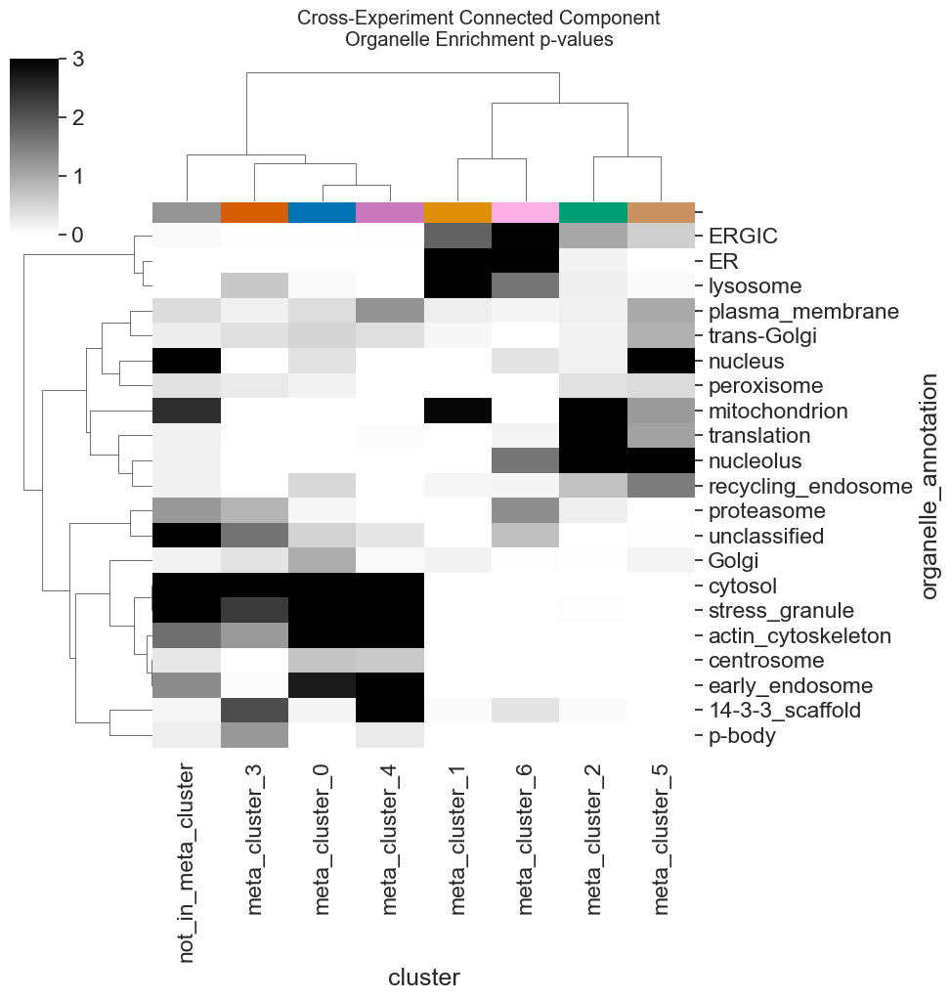

In [204]:
# make a custom column annotation
meta_colors_series = pd.Series(color_dict.values(), index=color_dict.keys())
plot_pvalue_clustermap(meta_cluster_organelle_enrichment,
                      title='Cross-Experiment Connected Component\nOrganelle Enrichment p-values', 
                      col_colors=meta_colors_series)
#plt.savefig(workdir + 'plots/cross_experiment_connected_component_organelle_enrichment_pvalues_anova_filt.pdf')

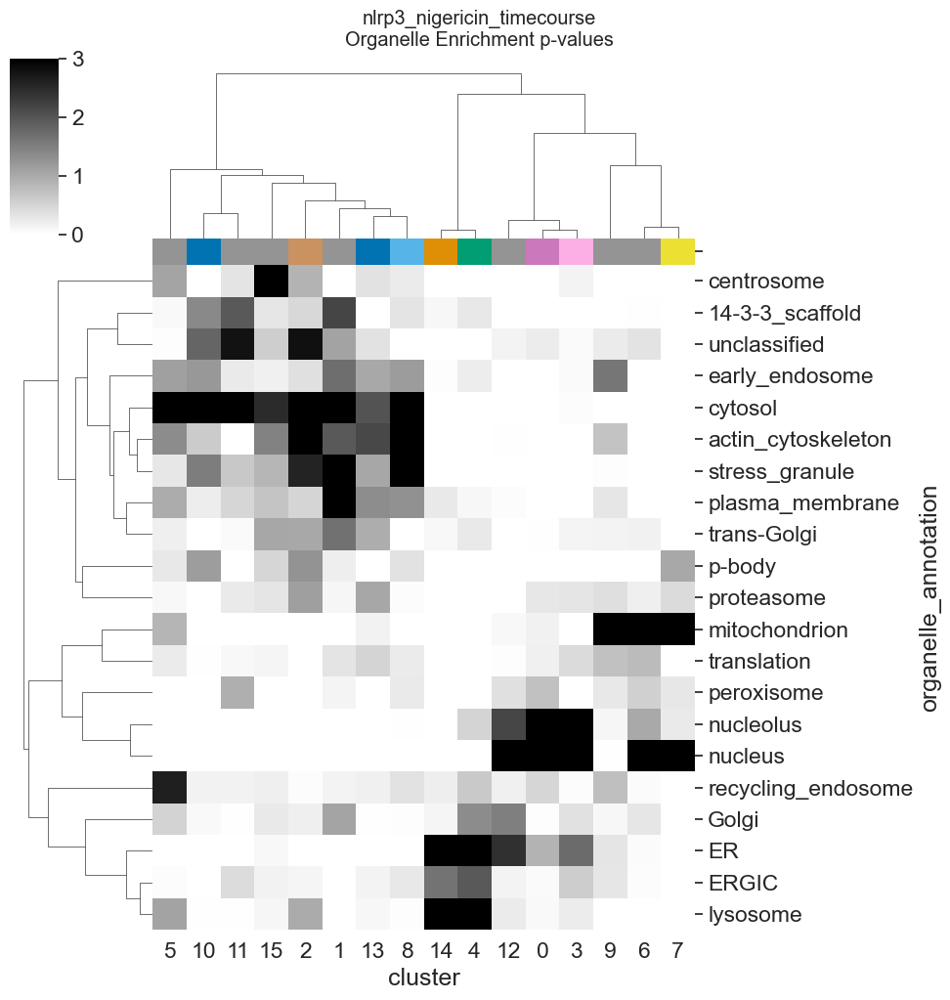

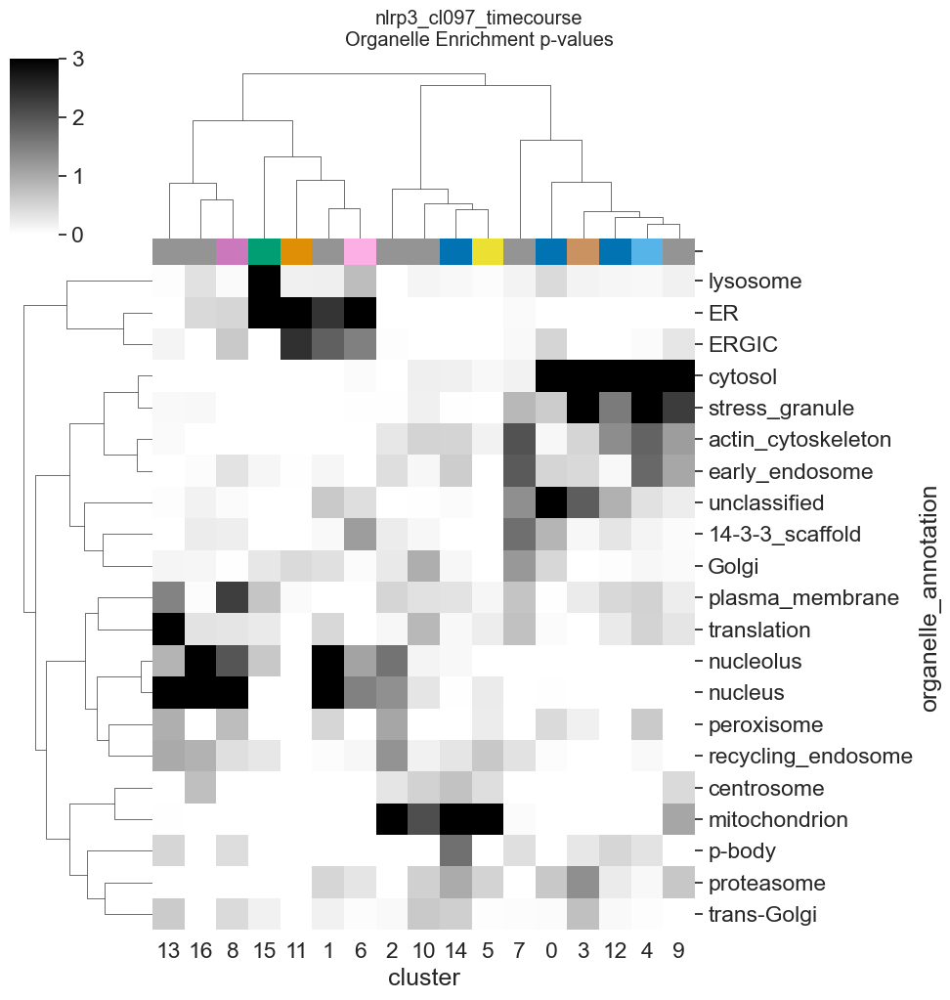

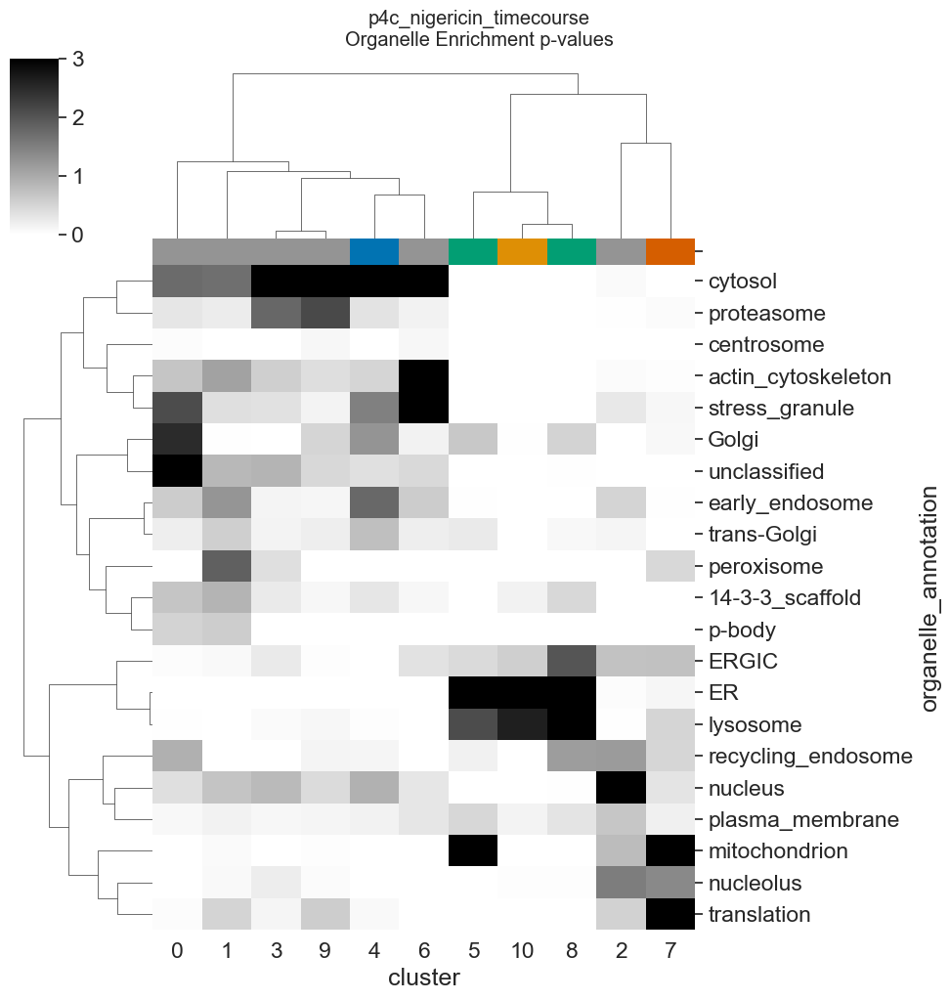

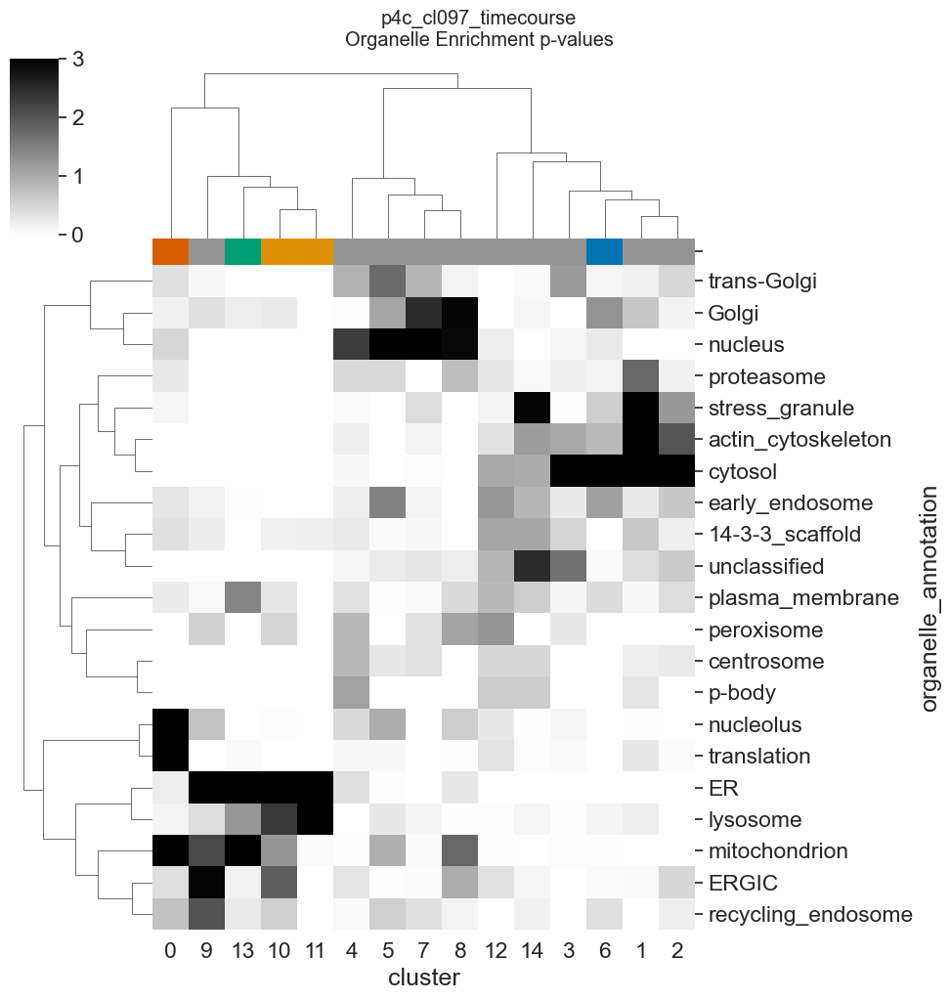

In [196]:
## For each individual timecourse experiment, plot the organelle enrichment
for k in ['nlrp3_nigericin_timecourse', 'nlrp3_cl097_timecourse', 
          'p4c_nigericin_timecourse', 'p4c_cl097_timecourse']:
    organelle_enrich_result = datasets[k]['cluster_fc']['organelle_enrichment']

    # get the meta-cluster colors
    leiden_meta_map = all_treat_connected_components.query(f'experiment == "{k}"')[['leiden_cluster', 'meta_cluster']].drop_duplicates()
    cluster_colors_series = pd.Series([color_dict[m] for m in leiden_meta_map.meta_cluster], 
                                   index=leiden_meta_map.leiden_cluster)

    plot_pvalue_clustermap(organelle_enrich_result, 
                           title=k+'\nOrganelle Enrichment p-values',
                           col_colors=cluster_colors_series)

    #plt.savefig(workdir + f'plots/{k}_organelle_enrichment_pvalues_anova_filt.pdf')

    

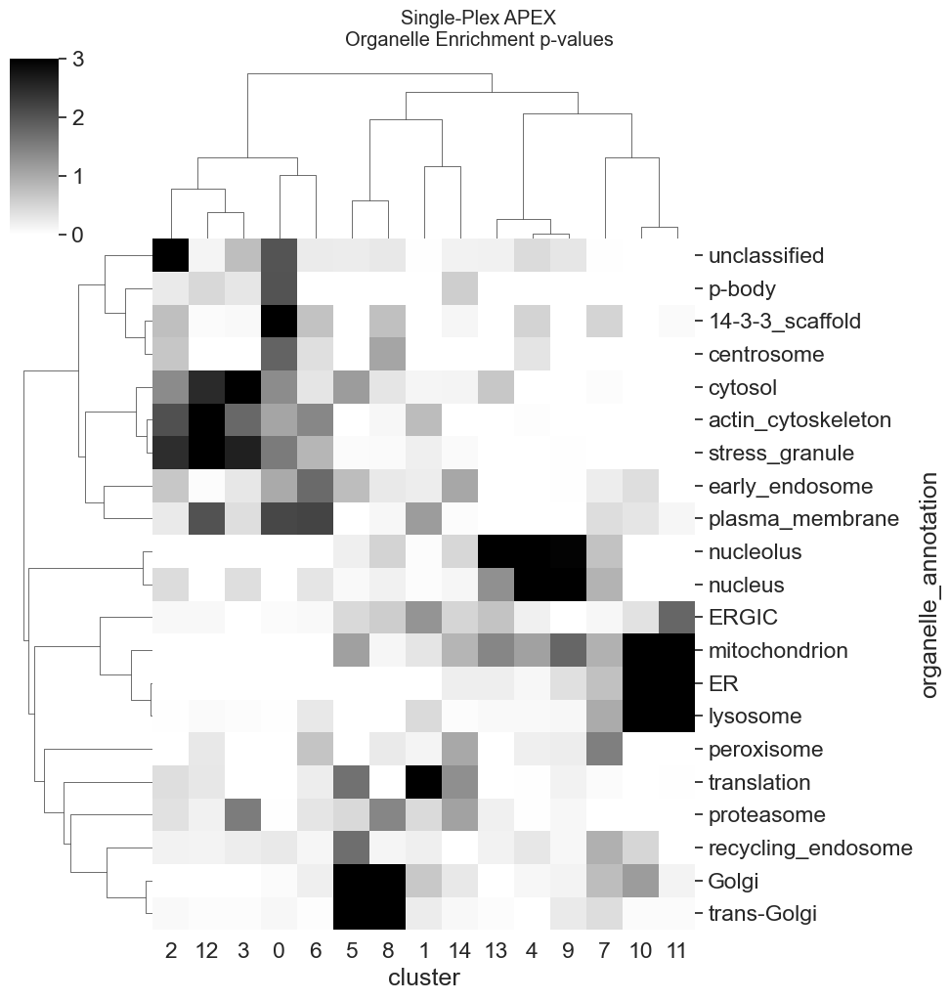

In [172]:
expt = 'all_bait_treat_single_plex'
plot_pvalue_clustermap(datasets[expt]['cluster_mean']['organelle_enrichment'],
                       title='Single-Plex APEX\nOrganelle Enrichment p-values')
plt.savefig(workdir + f'plots/{expt}_organelle_enrichment_pvalues_anova_filt.pdf')


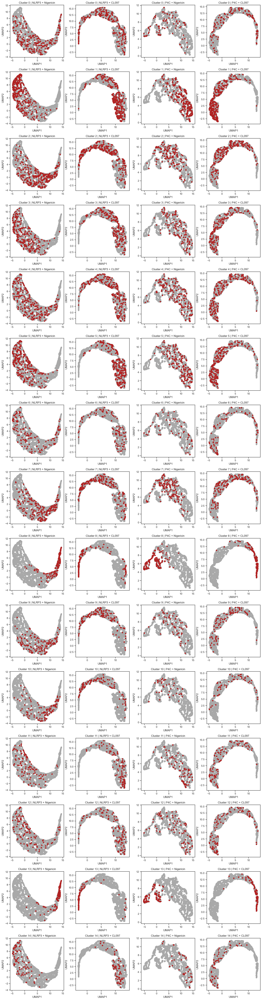

In [114]:
sp_clust3 = single_plex_results_df[single_plex_results_df['q.val_anova'] < 0.05].query('embedding_function == "no_transform" & leiden_cluster == "3"').external_gene_name.values
sp_clust1 = single_plex_results_df[single_plex_results_df['q.val_anova'] < 0.05].query('embedding_function == "no_transform" & leiden_cluster == "1"').external_gene_name.values

nigericin_nlrp3_results_df['is_singleplex_cluster3'] = [gene in sp_clust3 for gene in nigericin_nlrp3_results_df.external_gene_name]
nigericin_nlrp3_results_df['is_singleplex_cluster1'] = [gene in sp_clust1 for gene in nigericin_nlrp3_results_df.external_gene_name]

cl097_nlrp3_results_df['is_singleplex_cluster3'] = [gene in sp_clust3 for gene in cl097_nlrp3_results_df.external_gene_name]
cl097_nlrp3_results_df['is_singleplex_cluster1'] = [gene in sp_clust1 for gene in cl097_nlrp3_results_df.external_gene_name]

fig, ax = plt.subplots(15, 4, figsize=(16, 60))
color_palette={True: 'firebrick', False: 'darkgray'}

for i in range(15):
    sp_clust = single_plex_results_df[single_plex_results_df['q.val_anova'] < 0.05].query(f'embedding_function == "no_transform" & leiden_cluster == "{i}"').external_gene_name.values
    nigericin_nlrp3_results_df['is_singleplex_cluster'] = [gene in sp_clust for gene in nigericin_nlrp3_results_df.external_gene_name]
    cl097_nlrp3_results_df['is_singleplex_cluster'] = [gene in sp_clust for gene in cl097_nlrp3_results_df.external_gene_name]
    nigericin_p4c_results_df['is_singleplex_cluster'] = [gene in sp_clust for gene in nigericin_p4c_results_df.external_gene_name]
    cl097_p4c_results_df['is_singleplex_cluster'] = [gene in sp_clust for gene in cl097_p4c_results_df.external_gene_name]
        
    sns.scatterplot(nigericin_nlrp3_results_df.query('embedding_function == "no_transform"'
                                                    ).sort_values('is_singleplex_cluster'), x='xcol', y='ycol', 
                    hue='is_singleplex_cluster', palette=color_palette, linewidth=0, ax=ax[i][0], legend=False)
    sns.scatterplot(cl097_nlrp3_results_df.query('embedding_function == "no_transform"'
                                                    ).sort_values('is_singleplex_cluster'), x='xcol', y='ycol', 
                    hue='is_singleplex_cluster', palette=color_palette, linewidth=0, ax=ax[i][1], legend=False)

    sns.scatterplot(nigericin_p4c_results_df.query('embedding_function == "no_transform"'
                                                    ).sort_values('is_singleplex_cluster'), x='xcol', y='ycol', 
                    hue='is_singleplex_cluster', palette=color_palette, linewidth=0, ax=ax[i][2], legend=False)
    sns.scatterplot(cl097_p4c_results_df.query('embedding_function == "no_transform"'
                                                    ).sort_values('is_singleplex_cluster'), x='xcol', y='ycol', 
                    hue='is_singleplex_cluster', palette=color_palette, linewidth=0, ax=ax[i][3], legend=False)

    ax[i][0].set_title(f'Cluster {i} | NLRP3 + Nigericin')
    ax[i][1].set_title(f'Cluster {i} | NLRP3 + CL097')
    ax[i][2].set_title(f'Cluster {i} | P4C + Nigericin')
    ax[i][3].set_title(f'Cluster {i} | P4C + CL097')
    
    for j in range(4):
        ax[i][j].set_xlabel('UMAP1')
        ax[i][j].set_ylabel('UMAP2')

plt.tight_layout()
    


In [157]:
# merge by the enrichment
import matplotlib.colors as mcolors
import matplotlib.cm as cm

sns.set(font_scale=1, style='ticks')
def plot_cluster_enrichment_by_organelle(organelle_annotation_lst, embed_df, graph_intersect, xcol='umap1', ycol='umap2', xcol_name='UMAP1', ycol_name='UMAP2', col_wrap=4):

    num_row = int(np.ceil(len(organelle_annotation_lst)/col_wrap))
    
    merged_df = embed_df.merge(graph_intersect, left_on='leiden_cluster', right_on='cluster').query(f'organelle_annotation in @organelle_annotation_lst'
                                                                                  ).rename(columns={'gene_group_organelle':'number_of_organelle_genes_observed'
                                                                                                                                             })

    fig, axes = plt.subplots(num_row, col_wrap, figsize=(6*col_wrap, 5*num_row))


    axes_flat = axes.flatten()


    for i in range(len(organelle_annotation_lst)):
        row = int(np.floor(i/col_wrap))
        col = i % col_wrap


        ax = axes_flat[i]

        organelle = organelle_annotation_lst[i]
        df_subs = merged_df.query(f'organelle_annotation == "{organelle}"')
    
        # Get/set params for the colour mapping
        # get a clip value for the odds ratio
        clip_value = merged_df.odds_ratio[merged_df.odds_ratio > 0].min()/2
        # log scale it
        df_subs['log_odds_ratio'] = np.log2([np.max([x, clip_value]) for x in df_subs.odds_ratio])
        vcenter = 0
        vmin, vmax =  int(np.floor(df_subs["log_odds_ratio"].min())), int(np.ceil(df_subs["log_odds_ratio"].max()))
        if vcenter >= vmax:
            vmax=vcenter+1
        if vcenter <= vmin:
            vmin=vcenter-1
        normalize = mcolors.TwoSlopeNorm(vcenter=vcenter, vmin=vmin, vmax=vmax)
        colormap = cm.coolwarm

        g = sns.scatterplot(df_subs, x=xcol, y=ycol,  c=df_subs['log_odds_ratio'],  
                            cmap=colormap, norm=normalize, ax=ax, s=10, linewidth=0,
                           rasterized=True)
        ax.set_title(f'Cluster Enrichment for {organelle}')
        ax.set_xlabel(xcol_name)
        ax.set_ylabel(ycol_name)

        scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
        scalarmappaple.set_array(df_subs['odds_ratio'])
        cb = plt.colorbar(scalarmappaple, ax=ax)

        cb.set_ticks([vmin, 0, vmax])
        cb.set_ticklabels([f"1/{int(np.exp2(-vmin))}", "1", str(int(np.exp2(vmax)))]) 

    plt.tight_layout()



/var/folders/2z/syxkx9497zj7kskxl768d8ym0000gr/T/ipykernel_99054/1718621495.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subs['log_odds_ratio'] = np.log2([np.max([x, clip_value]) for x in df_subs.odds_ratio])
/var/folders/2z/syxkx9497zj7kskxl768d8ym0000gr/T/ipykernel_99054/1718621495.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subs['log_odds_ratio'] = np.log2([np.max([x, clip_value]) for x in df_subs.odds_ratio])
/var/folders/2z/syxkx9497zj7kskxl768d8ym0000gr/T/ipykernel_99054/1718621

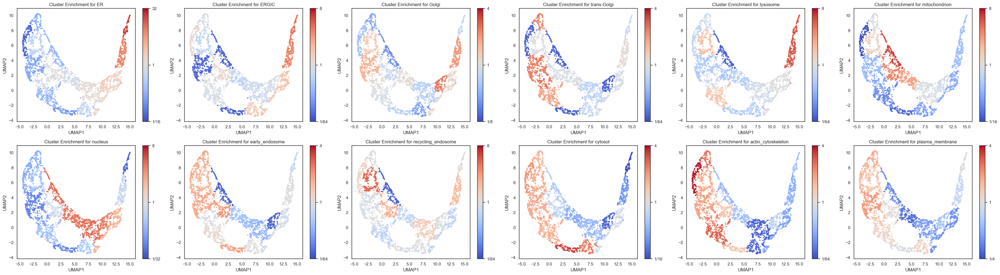

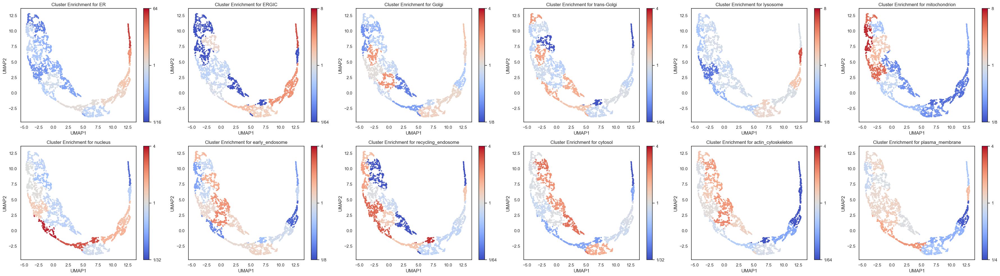

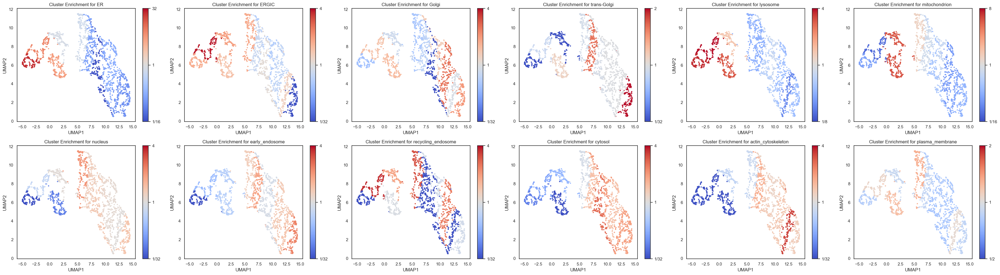

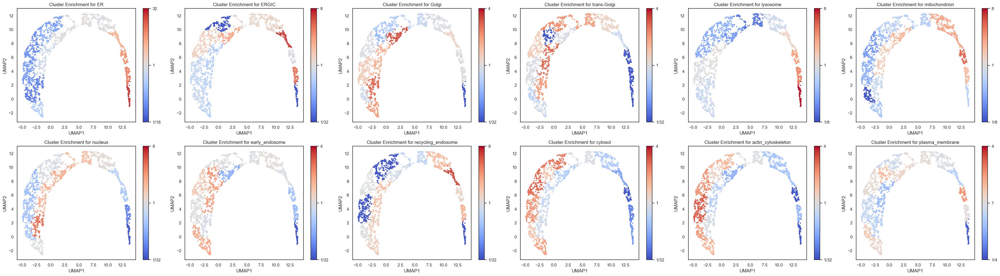

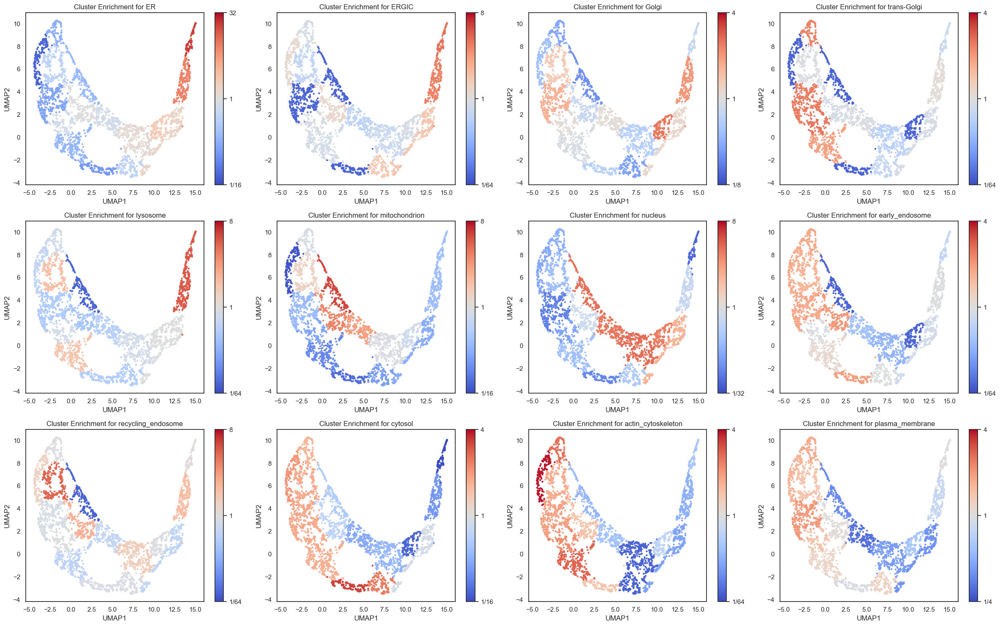

...

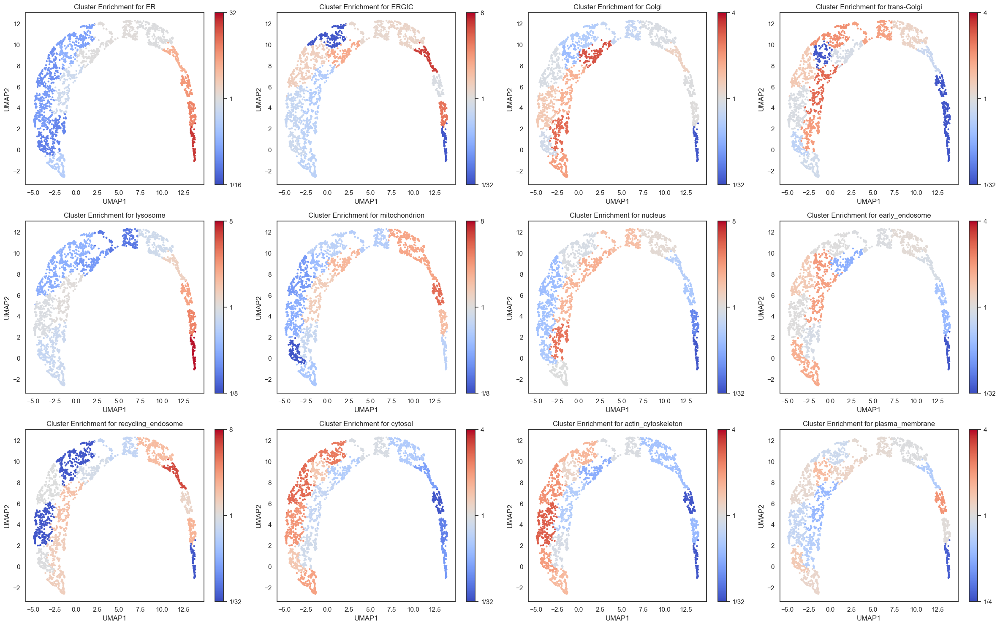

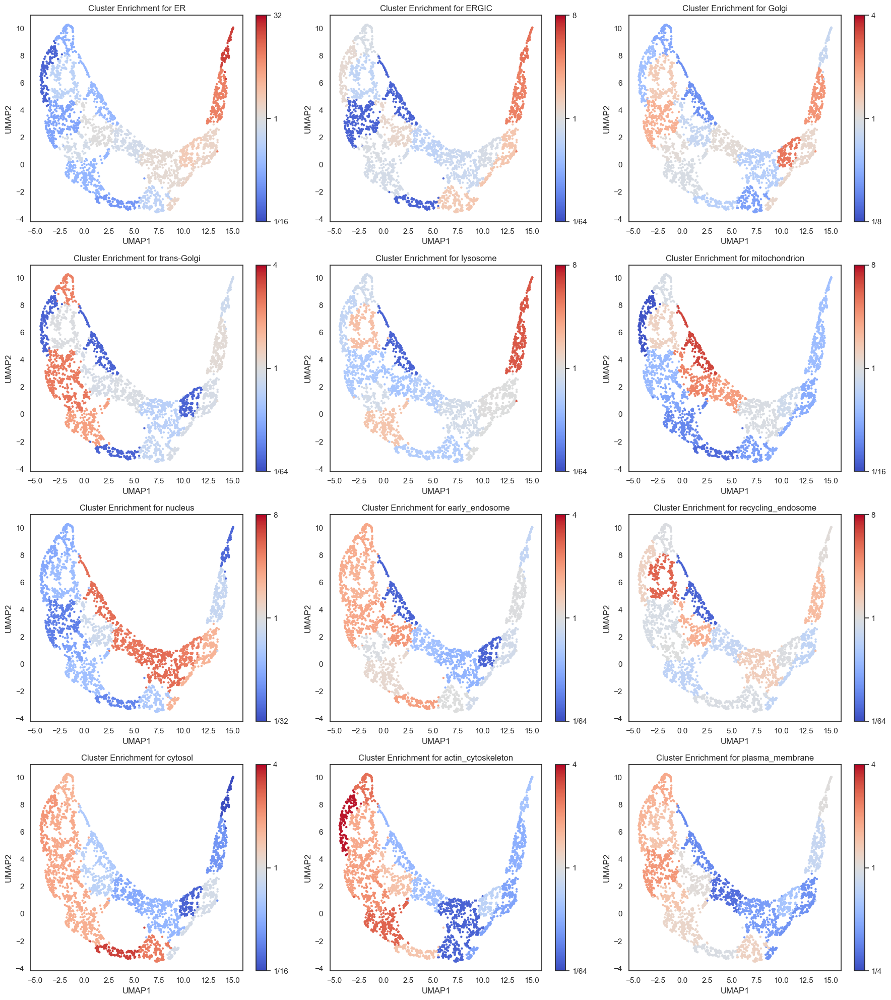

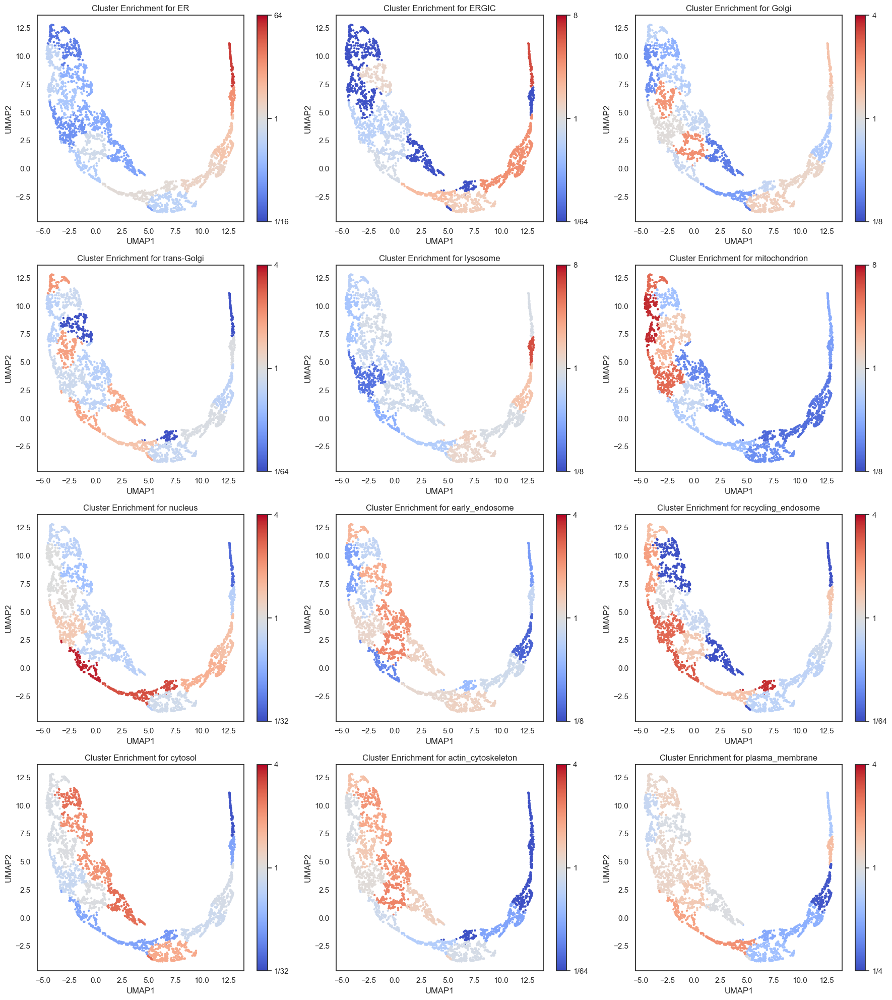

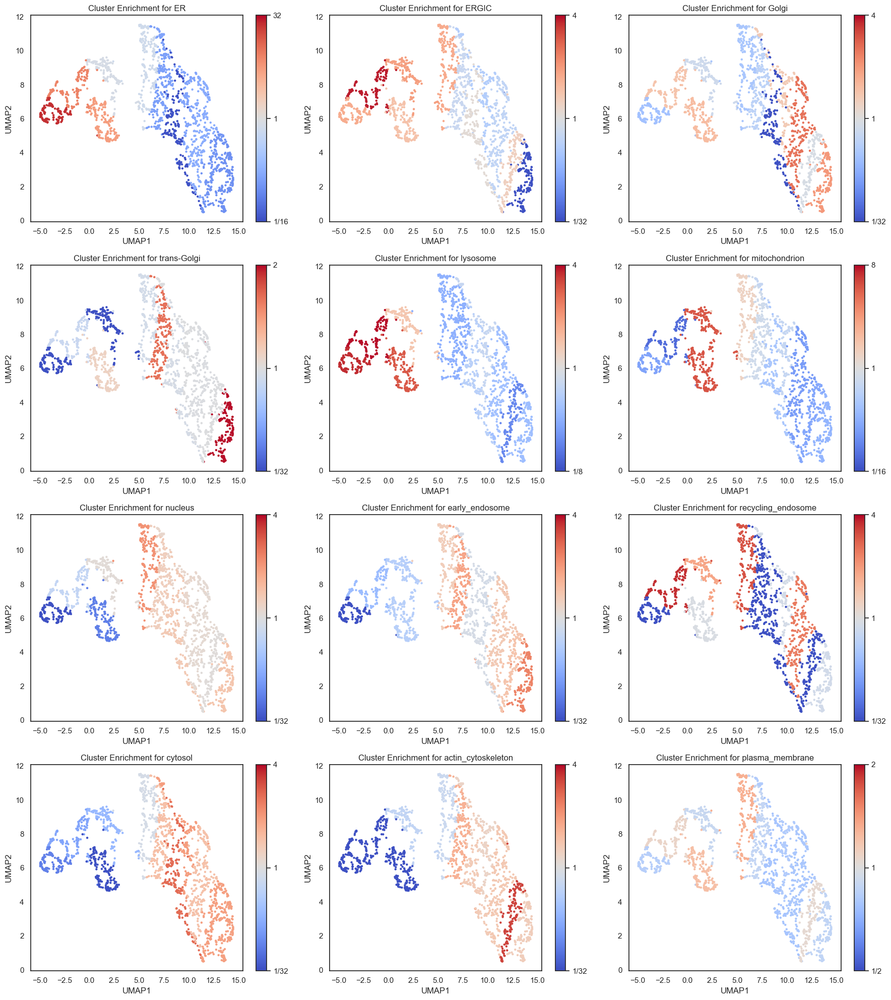

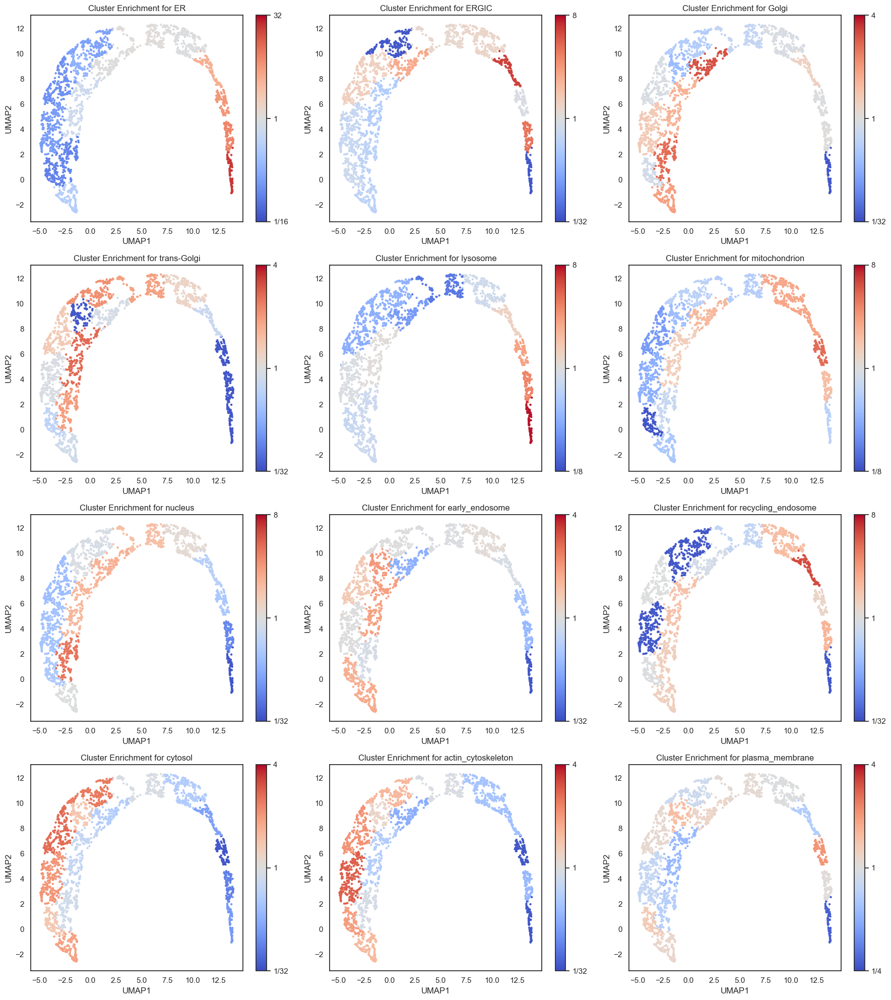

In [195]:
for col_wrap in [6, 4, 3]:
    for k in ['nlrp3_nigericin_timecourse', 'nlrp3_cl097_timecourse', 'p4c_nigericin_timecourse', 'p4c_cl097_timecourse']:
        res_df = datasets[k]['cluster_fc']['df'].query('embedding_function == "no_transform"')
        enrich_df = datasets[k]['cluster_fc']['organelle_enrichment']
        plot_cluster_enrichment_by_organelle(['ER', 'ERGIC', 'Golgi', 'trans-Golgi', 'lysosome', 
                                      'mitochondrion', 'nucleus', 'early_endosome', 'recycling_endosome', 
                                      'cytosol', 'actin_cytoskeleton', 'plasma_membrane'], 
                                         res_df, enrich_df,
                                        xcol='xcol', ycol='ycol', col_wrap=col_wrap)

        #plt.savefig(workdir + f"plots/{k}_UMAP_organelle_enrichment_{col_wrap}column_anova_filt.pdf", dpi=300)
